## FORMULA 1 
### Analysis of race results from 2015 to 2017 season

In [1]:
import numpy as np
import scipy 
import scipy.stats
from scipy import stats
import seaborn as sns
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import itertools
from itertools import groupby
import pickle
import os
import math
from sympy import S, symbols
from string import digits
from numpy import *

from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import Pipeline
from sklearn.metrics import r2_score

%config InlineBackend.figure_format = 'retina'
%matplotlib inline

plt.style.use('fivethirtyeight')
#sns.mpl.rcParams['figure.figsize'] = (16, 10)

# Directory to store pickled dataframes
directory = '/Users/dianaow/Documents/formula-1-race-data/dataframes/'

In [2]:
sns.set(rc={"font.style":"normal",
            "axes.facecolor":(0.9, 0.9, 0.9),
            "figure.facecolor":'white',
            "grid.color":'black',
            "grid.linestyle":':',
            "axes.grid":True,
            'axes.labelsize':30,
            'figure.figsize':(20.0, 15.0),
            'xtick.labelsize':20,
            'ytick.labelsize':20,
           })

current_palette = sns.color_palette("hls", 7)

In [3]:
def read_from_pickle(directory, filename):
    df = pd.DataFrame()
    filepath = directory + filename
    with open(filepath, 'rb') as file:
        df = pickle.load(file)
            
    return df

### Read in the CSV files.
#### (CSV files are downloaded from https://www.kaggle.com/cjgdev/formula-1-race-data-19502017)

In [4]:
df_results = pd.read_csv('./formula-1-race-data/results.csv')
df_circuits = pd.read_csv('./formula-1-race-data/circuits.csv')
df_constructors = pd.read_csv('./formula-1-race-data/constructors.csv')
df_drivers = pd.read_csv('./formula-1-race-data/drivers.csv')
df_driverStandings = pd.read_csv('./formula-1-race-data/driverStandings.csv')
df_lapTimes = pd.read_csv('./formula-1-race-data/lapTimes.csv')
df_pitStops = pd.read_csv('./formula-1-race-data/pitStops.csv')
df_qualifying = pd.read_csv('./formula-1-race-data/qualifying.csv')
df_races = pd.read_csv('./formula-1-race-data/races.csv')
df_results = pd.read_csv('./formula-1-race-data/results.csv')
df_seasons = pd.read_csv('./formula-1-race-data/seasons.csv')
df_status = pd.read_csv('./formula-1-race-data/status.csv')

In [5]:
# Some drivers have the same surnames, resolve this by replacing driverRef of the non-current driver with the full name

df_results.replace("max_verstappen", "verstappen", inplace=True)
df_results.replace("jolyon_palmer", "palmer", inplace=True)
df_results.replace("kevin_magnussen", "magnussen", inplace=True)
df_results.replace("brandon_hartley", "hartley", inplace=True)

df_drivers.replace("max_verstappen", "verstappen", inplace=True)
df_drivers.replace("jolyon_palmer", "palmer", inplace=True)
df_drivers.replace("kevin_magnussen", "magnussen", inplace=True)
df_drivers.replace("brandon_hartley", "hartley", inplace=True)

df_drivers.loc[75, "driverRef"] = 'jan_magnussen'
df_drivers.loc[49, "driverRef"] = 'jos_verstappen'
df_drivers.loc[155, "driverRef"] = 'jonathan_palmer'
df_drivers.loc[155, "driverRef"] = 'jonathan_palmer'
df_drivers.loc[813, "driverRef"] = 'di resta'

df_races.loc[942, "name"] = "Azerbaijan Grand Prix"

In [6]:
df_races = df_races[df_races['year'] < 2018]
df_races.tail(2)

,raceId,year,round,circuitId,name,date,time,url
974,987,2017,19,18,Brazilian Grand Prix,2017-11-12,16:00:00,https://en.wikipedia.org/wiki/2017_Brazilian_G...
975,988,2017,20,24,Abu Dhabi Grand Prix,2017-11-26,13:00:00,https://en.wikipedia.org/wiki/2017_Abu_Dhabi_G...


In [7]:
max_laps = pd.DataFrame()
max_laps["total laps"] = df_results.groupby("raceId").laps.max()
max_laps = max_laps.reset_index()
df_races_maxlaps = pd.merge(df_races, max_laps, on='raceId', how='left')
df_races_maxlaps = df_races_maxlaps[['raceId', 'year', 'name', 'total laps']]

# Categorize the races according to the number of laps
for i,row in df_races_maxlaps.iterrows():
    if df_races_maxlaps.loc[i,'total laps'] <=50 :
        df_races_maxlaps.loc[i,'category'] = "<=50"
    elif (df_races_maxlaps.loc[i,'total laps'] > 50) & (df_races_maxlaps.loc[i,'total laps'] <= 55):
        df_races_maxlaps.loc[i,'category'] = ">50 & <= 55"
    elif (df_races_maxlaps.loc[i,'total laps'] > 55) & (df_races_maxlaps.loc[i,'total laps'] <= 61):
        df_races_maxlaps.loc[i,'category'] = ">55 & <= 61"
    elif (df_races_maxlaps.loc[i,'total laps'] == 66):
        df_races_maxlaps.loc[i,'category'] = "66"
    elif (df_races_maxlaps.loc[i,'total laps'] >= 70) & (df_races_maxlaps.loc[i,'total laps'] <= 71):
        df_races_maxlaps.loc[i,'category'] = ">=70 & <= 71"
    elif (df_races_maxlaps.loc[i,'total laps'] == 78):
        df_races_maxlaps.loc[i,'category'] = "78"
             
df_races_maxlaps.to_pickle(os.path.join(directory,  "df_races_maxlaps.pickle"))

In [8]:
# Extract the names and ids of races for each season

races_names_2015 = list(df_races[df_races['year'] == 2015].name.unique())
races_ids_2015 = list(df_races[df_races['year'] == 2015].raceId.unique())
races_names_2016 = list(df_races[df_races['year'] == 2016].name.unique())
races_ids_2016 = list(df_races[df_races['year'] == 2016].raceId.unique())
races_names_2017 = list(df_races[df_races['year'] == 2017].name.unique())
races_ids_2017 = list(df_races[df_races['year'] == 2017].raceId.unique())

tyre_types = ['Soft', 'Super soft', 'Ultra soft', 'Wet', 'Intermediate', 'Medium', 'Hard']
stints = [1,2,3,4]

In [534]:
# Extract the names and ids of drivers for each season

df_drivers_2016 = pd.DataFrame(df_results[df_results['raceId'].isin(races_ids_2016)].driverId.unique(), columns=['driverId'])
df_drivers_2016 = pd.merge(df_drivers_2016, df_drivers[['driverId', 'driverRef']], on='driverId', how='left')

df_drivers_2017 = pd.DataFrame(df_results[df_results['raceId'].isin(races_ids_2017)].driverId.unique(), columns=['driverId'])
df_drivers_2017 = pd.merge(df_drivers_2017, df_drivers[['driverId', 'driverRef']], on='driverId', how='left')

In [537]:
df_drivers.to_pickle(os.path.join(directory,  "df_drivers.pickle"))
df_races.to_pickle(os.path.join(directory,  "df_races.pickle"))
df_drivers_2016.to_pickle(os.path.join(directory,  "df_drivers_2016.pickle"))
df_drivers_2017.to_pickle(os.path.join(directory,  "df_drivers_2017.pickle"))

### RACE LAPTIMES

In [10]:
# year input variable must be an integer in a list eg [2016]

def filter_laptimes(df_lapTimes, year, race_name, driver_name):
    """Returns a dataframe filtered by year (eg 2016) and name of race (eg "Australian Grand Prix")"""

    df_race = df_races[df_races['year'].isin(year)]
    df_lapTimes_race = df_lapTimes.loc[df_lapTimes['raceId'].isin(df_race['raceId'])]
    df_M_lapTimes_race = pd.merge(df_lapTimes_race, df_race.loc[:,['name', 'raceId']], on='raceId')
    drivers_ids = df_M_lapTimes_race['driverId'].unique()
    df_drivers_year = df_drivers.loc[df_drivers['driverId'].isin(drivers_ids)]
    df_laptimes_race_drivers = pd.merge(df_M_lapTimes_race, df_drivers_year.loc[:,['driverId', 'driverRef']], on='driverId')
    
    if race_name and driver_name:
        grouped_race = df_laptimes_race_drivers.groupby("name").get_group(race_name)
        data = grouped_race.groupby("driverRef").get_group(driver_name)
    elif race_name:
        data = df_laptimes_race_drivers.groupby("name").get_group(race_name)
    elif driver_name: 
        data = df_laptimes_race_drivers.groupby("driverRef").get_group(driver_name)
    else: 
        data = df_laptimes_race_drivers
        
    return data

In [11]:
def filter_outliers_percentile(data, time_field='milliseconds', id_field='driverRef'):
    """Returns a logical vector corresponding to the outliers (based on percentiles) for each driver. True values are the outliers"""

    time75, time25 = np.percentile(data[time_field], [75 ,25])
    iqrtime = time75 - time25        
    timemin = time25-(iqrtime*1.5)   
    timemax = time75+(iqrtime*1.5) 

    outliers = lambda x: (
        (x < timemin) |
        (x > timemax)
    )
    
    df_outlier = data.groupby(id_field)[[time_field]].apply(outliers).rename(columns = {"milliseconds":"outlier"})
    data = pd.merge(data, df_outlier, left_index = True, right_index = True)
    data = data[data['outlier'] == False]
    data = data[data['lap'] != 1]
    
    return data

In [12]:
def filter_outliers_timediff(data, time_field='milliseconds', id_field='driverRef'):
    """Returns a logical vector corresponding to the outliers (time diff between next lap more than 1000ms) for each driver."""

    def time_diff(df):
        df['time_diff'] = df['milliseconds'].diff()
        return df
    
    data = data.groupby(id_field).apply(time_diff).reset_index()
    data['time_diff'] = abs(data['time_diff'])
    data['outlier'] = (data['time_diff'] > 1000)
    data = data[data['outlier'] == False]
    data = data[data['lap'] != 1]

    return data

In [13]:
def filter_layer(data, df_pitStops, function, time_field='milliseconds', id_field='driverRef'):
    
    filtered1 = function(data, time_field, id_field)
    filtered2 = filter_pitlap_inlap_outlap(data, df_pitStops)
    
    filtered1_mapped = pd.merge(data, filtered1[['driverId', "raceId", "lap", "outlier"]], on=['driverId', "raceId", "lap"])
    filtered2_mapped = pd.merge(filtered1_mapped, filtered2[['driverId', "raceId", "lap", "pitlaps/inlaps/outlaps"]], on=['driverId', "raceId", "lap"])
    
    return filtered2_mapped

## PIT LAPS

In [14]:
def filter_pitlaps(year, race_name, driver_name, df_pitStops = df_pitStops):
    
    df_pitStops = pd.merge(df_pitStops, df_races[['raceId', 'year', 'name']], on='raceId')

    df_race = df_pitStops[df_pitStops['year'].isin(year)]
    df_pitStops_race = df_pitStops.loc[df_pitStops['raceId'].isin(df_race['raceId'])]
    drivers_ids = df_pitStops_race['driverId'].unique()
    df_drivers_year = df_drivers.loc[df_drivers['driverId'].isin(drivers_ids)]
    df_pitStops_race_drivers = pd.merge(df_pitStops_race, df_drivers_year.loc[:,['driverId', 'driverRef']], on='driverId').sort_values(['raceId', 'driverId', 'lap'])
                                        
    if race_name and driver_name:
        grouped_race = df_pitStops_race_drivers.groupby("name").get_group(race_name)
        data = grouped_race.groupby("driverRef").get_group(driver_name)
    elif race_name:
        data = df_pitStops_race_drivers.groupby("name").get_group(race_name)
    elif driver_name: 
        data = df_pitStops_race_drivers.groupby("driverRef").get_group(driver_name)
    else: 
        data = df_pitStops_race 

    return data

In [15]:
def filter_pitlap_inlap_outlap(df, df_pitStops):
    
    df_pitStops = pd.merge(df_pitStops, df_races[['raceId', 'year', 'name']], on='raceId')
    
    inlaps = pd.DataFrame()
    inlaps['lap'] = df_pitStops['lap'] - 1 
    inlaps["raceId"] = df_pitStops['raceId']
    inlaps["driverId"] = df_pitStops['driverId'] 
    inlaps = pd.merge(inlaps, df_races[['raceId', 'year', 'name']], on='raceId')
    
    outlaps = pd.DataFrame()
    outlaps["lap"] = df_pitStops['lap'] + 1 
    outlaps["raceId"] = df_pitStops['raceId']
    outlaps["driverId"] = df_pitStops['driverId'] 
    outlaps = pd.merge(outlaps, df_races[['raceId', 'year', 'name']], on='raceId')
    
    tofilter = pd.concat([df_pitStops, inlaps])
    tofilter = pd.concat([tofilter, outlaps])
    df_race = pd.merge(tofilter, df_drivers[['driverId', 'driverRef']], on='driverId')
    df_race['pitlaps/inlaps/outlaps'] = "yes"

    mapped = pd.merge(df, df_race[['driverId', 'raceId', 'lap', 'pitlaps/inlaps/outlaps']], on=['driverId', 'raceId', 'lap'], how='left')
    filtered = mapped[mapped['pitlaps/inlaps/outlaps'] != 'yes']
    
    return filtered

In [16]:
pitlaps_151617 = filter_pitlaps([2015, 2016, 2017], "", "", df_pitStops = df_pitStops)
df_status = pd.merge(pitlaps_151617[['raceId', 'driverId', 'stop']], df_results[['raceId', 'driverId', 'statusId', 'laps']], on=['raceId', 'driverId'], how='left')
df_status['is_duplicated'] = df_status.sort_values('stop', ascending=False).duplicated(subset=['raceId', 'driverId'], keep='first')
df_status = df_status[df_status['is_duplicated'] == False].drop(['is_duplicated'], axis=1)

## SAFETY CAR LAPS

In [17]:
xl = pd.ExcelFile("./formula-1-race-data/SC_lap_numbers.xlsx", encoding='utf-8')
xl.sheet_names
sc_laps = xl.parse("Safety car laps")
sc_laps.fillna(0, inplace=True)

In [42]:
def filter_SClaps(sc_laps, df):
    
    sc_laps = pd.merge(sc_laps, df_races[['year', 'name', 'raceId']], on=['year', 'name'], how='left')
    sc_laps = pd.merge(df, sc_laps, on=['year', 'raceId', 'name'], how='left')
    for i,row in sc_laps.iterrows():
        if (sc_laps.loc[i,"lap"] >= sc_laps.loc[i,"SC start 1"]) & (sc_laps.loc[i,"lap"] <= sc_laps.loc[i,"SC end 1"]):
            sc_laps.loc[i,"SC lap"] = "Yes"
        elif (sc_laps.loc[i,"lap"] >= sc_laps.loc[i,"SC start 2"]) & (sc_laps.loc[i,"lap"] <= sc_laps.loc[i,"SC end 2"]):
            sc_laps.loc[i,"SC lap"] = "Yes"
        elif (sc_laps.loc[i,"lap"] >= sc_laps.loc[i,"SC start 3"]) & (sc_laps.loc[i,"lap"] <= sc_laps.loc[i,"SC end 3"]):
            sc_laps.loc[i,"SC lap"] = "Yes"
        else:
            sc_laps.loc[i,"SC lap"] = "No"

    sc_laps = sc_laps[['raceId', 'driverId', 'stint', 'SC lap']]
    sc_laps['is_dup'] = sc_laps.duplicated(keep='first')
    sc_laps = sc_laps[sc_laps['is_dup'] == False]
    sc_laps = sc_laps[sc_laps['SC lap'] == "Yes"].drop(['is_dup'], axis=1)
    #sc_laps = sc_laps.drop(['SC start 1', 'SC end 1', 'SC start 2', 'SC end 2', 'SC start 3', 'SC end 3', 'First lap crash', 'SC lap'], axis=1)
    
    return sc_laps

## TYRE USE

In [19]:
import pandas as pd
xl = pd.ExcelFile("./formula-1-race-data/Tyre_Information.xlsx", encoding='utf-8')
xl.sheet_names
tyres = xl.parse("Tyres_used_labelled")

In [20]:
tyres.replace('Super Soft', 'Super soft',inplace=True)
tyres.replace('Ultra Soft', 'Ultra soft',inplace=True)
tyres.replace('Used Ultra Soft', 'Used Ultra soft',inplace=True)
tyres.replace('Used Super Soft', 'Used Super soft',inplace=True)
tyres.replace('Used soft', 'Used Soft',inplace=True)

In [21]:
def tyre_use_race(df, year, race_name, driver_name):
    
    df = df.iloc[:, 0:16]
    df.columns = [x.lower() for x in df.columns]
    df = df.loc[df['year'].isin(year)]
    df["driverRef"] = [row.split(' ', 1 )[1].lower() for row in df['driver']]
    df = df.rename(columns = {'race': 'name'})
    
    df['first set'].fillna("None", inplace = True)
    df['second set'].fillna("None", inplace = True)
    df['third set'].fillna("None", inplace = True)
    df['fourth set'].fillna("None", inplace = True)
    df['fifth set'].fillna("None", inplace = True)
    df['sixth set'].fillna("None", inplace = True)
    
    df['first set'] = df['first set'].str.strip()
    df['second set'] = df['second set'].str.strip()
    df['third set'] = df['third set'].str.strip()
    df['fourth set'] = df['fourth set'].str.strip()
    df['fifth set'] = df['fifth set'].str.strip()
    df['sixth set'] = df['sixth set'].str.strip()
    
    df['stint'].fillna(0, inplace = True)
    df['stint.1'].fillna(0, inplace = True)
    df['stint.2'].fillna(0, inplace = True)
    df['stint.3'].fillna(0, inplace = True)
    df['stint.4'].fillna(0, inplace = True)
    df['stint.5'].fillna(0, inplace = True)

    if race_name and driver_name:
        grouped_race = df.groupby("name").get_group(race_name)
        df = grouped_race.groupby("driverRef").get_group(driver_name)
    elif race_name:
        df = df.groupby("name").get_group(race_name)
    elif driver_name: 
        df = df.groupby("driverRef").get_group(driver_name)
    
    df = pd.merge(df, df_races[["year", "name", "raceId"]], left_on=['year', 'name'], right_on=['year', 'name'])
    df = pd.merge(df, df_drivers[['driverRef', 'driverId']], left_on=['driverRef'], right_on=['driverRef'])
    df = df.rename(columns={'stint': 'stint 1', 'stint.1': 'stint 2', 
                            'stint.2': 'stint 3', 'stint.3': 'stint 4',
                            'stint.4': 'stint 5', 'stint.5': 'stint 6'})
    df.drop('driver', axis=1, inplace=True)
        
    dcr = pd.merge(df_results[['driverId', 'constructorId', 'raceId']], df_drivers[['driverId', 'driverRef']], on=['driverId'], how='left')
    dcrm = pd.merge(dcr, df_races[['raceId', 'year', 'name']], on=['raceId'], how='left')
    dcrm = pd.merge(dcrm, df_constructors[['constructorId', 'constructorRef']], on=['constructorId'], how='left')
    df = pd.merge(df, dcrm, on=['year', 'name', 'driverRef', 'raceId', 'driverId'], how='left')

    return df

In [22]:
df_tyres = tyre_use_race(tyres, [2015, 2016, 2017], "", "")
df_tyres.to_pickle(os.path.join(directory,  "df_tyres.pickle"))

In [23]:
df_tyres.head()

,year,name,first set,stint 1,second set,stint 2,third set,stint 3,fourth set,stint 4,fifth set,stint 5,sixth set,stint 6,total/verify,driverRef,raceId,driverId,constructorId,constructorRef
0,2015,Abu Dhabi Grand Prix,Super soft,10.0,Soft,21.0,Soft,24.0,None,0.0,None,0.0,None,0.0,55.0,rosberg,945,3,131.0,mercedes
1,2016,Abu Dhabi Grand Prix,Used Ultra soft,8.0,Soft,21.0,Soft,26.0,None,0.0,None,0.0,None,0.0,55.0,rosberg,968,3,131.0,mercedes
2,2015,Australian Grand Prix,Soft,16.0,Medium,42.0,None,0.0,None,0.0,None,0.0,None,0.0,58.0,rosberg,926,3,131.0,mercedes
3,2016,Australian Grand Prix,Used Super soft,12.0,Soft,6.0,Medium,39.0,None,0.0,None,0.0,None,0.0,57.0,rosberg,948,3,131.0,mercedes
4,2015,Austrian Grand Prix,Super soft,33.0,Soft,38.0,None,0.0,None,0.0,None,0.0,None,0.0,71.0,rosberg,933,3,131.0,mercedes


In [24]:
# Transform the df_tyres dataframe

df_tyres_set = pd.melt(df_tyres, id_vars=['year', 'name', 'driverRef', 'constructorRef'], value_vars=['first set', 'second set', 'third set', 'fourth set'])
df_tyres_set.columns =['year', 'name', 'driverRef', 'constructorRef','set', 'tyre']
df_tyres_stint = pd.melt(df_tyres, id_vars=['year', 'name', 'driverRef', 'constructorRef'], value_vars=['stint 1', 'stint 2', 'stint 3', 'stint 4'])
tyres_melt = pd.merge(df_tyres_set, df_tyres_stint, on=['year', 'name', 'driverRef', 'constructorRef'], how='left')
tyres_melt.sort_values(['name', 'driverRef', 'year', 'constructorRef'], ascending=True)
t1 = tyres_melt[(tyres_melt['set'] == 'first set') & (tyres_melt['variable'] == 'stint 1')]
t2 = tyres_melt[(tyres_melt['set'] == 'second set') & (tyres_melt['variable'] == 'stint 2')]
t3 = tyres_melt[(tyres_melt['set'] == 'third set') & (tyres_melt['variable'] == 'stint 3')]
t4 = tyres_melt[(tyres_melt['set'] == 'fourth set') & (tyres_melt['variable'] == 'stint 4')]
tm = pd.concat([t1, t2, t3, t4])
tm["stint"] = tm["variable"].str.replace("stint ", "").apply(pd.to_numeric, errors='coerce')
tm = tm.drop(['variable', 'set'], axis=1)

In [25]:
tm.head()

,year,name,driverRef,constructorRef,tyre,value,stint
0,2015,Abu Dhabi Grand Prix,rosberg,mercedes,Super soft,10.0,1
4,2016,Abu Dhabi Grand Prix,rosberg,mercedes,Used Ultra soft,8.0,1
8,2015,Australian Grand Prix,rosberg,mercedes,Soft,16.0,1
12,2016,Australian Grand Prix,rosberg,mercedes,Used Super soft,12.0,1
16,2015,Austrian Grand Prix,rosberg,mercedes,Super soft,33.0,1


In [26]:
# Unfinished stints are indicated with zero value for the stint length. Examples below.
tm[tm['value'] == 0].head()

,year,name,driverRef,constructorRef,tyre,value,stint
124,2015,Russian Grand Prix,rosberg,mercedes,Super soft,0.0,1
144,2016,Spanish Grand Prix,rosberg,mercedes,Soft,0.0,1
372,2016,Spanish Grand Prix,hamilton,mercedes,Soft,0.0,1
416,2015,Austrian Grand Prix,raikkonen,ferrari,None,0.0,1
464,2016,Brazilian Grand Prix,raikkonen,ferrari,Wet,0.0,1


In [27]:
def no_unfinished_stints(df, df_status):
    """Function to remove laps of an incomplete stint"""
    
    df = pd.merge(df, df_status, on=["raceId", "driverId"], how='left')
    df = df[df["stop"].notnull()]
    for i, row in df.iterrows():
        X = "unfinished"
        if row['statusId'] != 1.:
            if row['stop'] == 3.:
                df.loc[i, 'stint 4']=np.nan
                df.loc[i, 'fourth set']= np.nan
            elif row['stop'] == 2.:
                df.loc[i, 'stint 3']=np.nan
                df.loc[i, 'third set']= np.nan
            elif row['stop'] == 1.:
                df.loc[i, 'stint 2']=np.nan
                df.loc[i, 'second set']= np.nan 
            elif row['stop'] == 0.:
                df.loc[i, 'stint 1']=np.nan
                df.loc[i, 'first set']= np.nan

    return df

In [28]:
def tyre_use_race_laptimes(df, df_tyres):
    """Function to create/merge tyre information for each lap to race laptimes"""
    
    df = pd.merge(df, df_tyres, on=['raceId', 'driverId', 'name', 'driverRef'])
    
    df['stint 1+2'] = df['stint 1'] + df['stint 2']
    df['stint 1+2+3'] = df['stint 1'] + df['stint 2'] + df['stint 3']
    df['stint 1+2+3+4'] = df['stint 1'] + df['stint 2'] + df['stint 3'] + df['stint 4']
    df['stint 1+2+3+4+5'] = df['stint 1'] + df['stint 2'] + df['stint 3'] + df['stint 4'] + df['stint 5']
    df['stint 1+2+3+4+5+6'] = df['stint 1'] + df['stint 2'] + df['stint 3'] + df['stint 4'] + df['stint 5'] + df['stint 6']
    
    df['tyre'] = np.where((df['lap'] <= df['stint 1']), df['first set'], np.nan)
    df['tyre2'] = np.where((df['lap'] > df['stint 1']) & (df['lap'] <= df['stint 1+2']), df['second set'], np.nan)
    df['tyre3'] = np.where((df['lap'] > df['stint 1+2']) & (df['lap'] <= df['stint 1+2+3']), df['third set'], np.nan)
    df['tyre4'] = np.where((df['lap'] > df['stint 1+2+3']) & (df['lap'] <= df['stint 1+2+3+4']), df['fourth set'], np.nan)
    df['tyre5'] = np.where((df['lap'] > df['stint 1+2+3+4']) & (df['lap'] <= df['stint 1+2+3+4+5']), df['fifth set'], np.nan)
    df['tyre6'] = np.where((df['lap'] > df['stint 1+2+3+4+5']) & (df['lap'] <= df['stint 1+2+3+4+5+6']), df['fifth set'], np.nan)
    
    df['tyre'].fillna(df['tyre2'], inplace=True)
    df['tyre'].fillna(df['tyre3'], inplace=True)
    df['tyre'].fillna(df['tyre4'], inplace=True)
    df['tyre'].fillna(df['tyre5'], inplace=True)
    df['tyre'].fillna(df['tyre6'], inplace=True)
    
    df['stint'] = np.where((df['lap'] <= df['stint 1']), 1, np.nan)
    df['stint2'] = np.where((df['lap'] > df['stint 1']) & (df['lap'] <= df['stint 1+2']), 2, np.nan)
    df['stint3'] = np.where((df['lap'] > df['stint 1+2']) & (df['lap'] <= df['stint 1+2+3']), 3, np.nan)
    df['stint4'] = np.where((df['lap'] > df['stint 1+2+3']) & (df['lap'] <= df['stint 1+2+3+4']), 4, np.nan)
    df['stint5'] = np.where((df['lap'] > df['stint 1+2+3+4']) & (df['lap'] <= df['stint 1+2+3+4+5']), 5, np.nan)
    df['stint6'] = np.where((df['lap'] > df['stint 1+2+3+4+5']) & (df['lap'] <= df['stint 1+2+3+4+5+6']), 6, np.nan)
    
    df['stint'].fillna(df['stint2'], inplace=True)
    df['stint'].fillna(df['stint3'], inplace=True)
    df['stint'].fillna(df['stint4'], inplace=True)
    df['stint'].fillna(df['stint5'], inplace=True)
    df['stint'].fillna(df['stint6'], inplace=True)

    df.drop(['stint2', 'stint3', 'stint4', 'stint5', 'stint6',
             'stint 1', 'stint 2', 'stint 3', 'stint 4', 'stint 5', 'stint 6',
             'stint 1+2', 'stint 1+2+3', 'stint 1+2+3+4', 'stint 1+2+3+4+5', 'stint 1+2+3+4+5+6',
             'tyre2', 'tyre3', 'tyre4', 'tyre5', 'tyre6',
             'first set', 'second set', 'third set', 'fourth set', 'fifth set', 'sixth set'], axis=1, inplace=True)

    return df

## VISUALIZE RACE LAPTIMES

In [43]:
def time_box_plot(data, data_tyres, df_pitStops, df_status, time_field, id_field, title = '', ylabel = 'Driver', xlabel = "Lap Time(s)"):

    # sort laps by finish order, where not all finish on the last lap
    def add_min(group):
        group['min_time'] = group[time_field].min()
        return group
        
    df_filtered = filter_pitlap_inlap_outlap(data, df_pitStops) # remove pitlaps/inlaps/outlaps
    #df_filtered = filter_SClaps(sc_laps, df_filtered) # remove safety car laps
    df_filtered = df_filtered[df_filtered['lap'] != 1] # remove first lap
    nounfstints = no_unfinished_stints(data_tyres, df_status) # remove unfinished stints
    
    df_new = tyre_use_race_laptimes(df_filtered, nounfstints)

    data_no_outliers = df_new.groupby(id_field).apply(add_min)
    time_order = data_no_outliers.sort_values(['min_time'])[id_field].unique()

    ids = reversed(list(time_order))
    ids = [str(item) for item in ids]

    ax = sns.boxplot(data_no_outliers[time_field], data_no_outliers[id_field], order=ids, orient='h')
    plt.title(title)
    plt.ylabel(ylabel)
    plt.xlabel(xlabel)

    return ax

In [30]:
def laptime_chart(data, ylabel = 'Driver', xlabel = "Lap Time(s)"):
    
    for index, driver in enumerate(data["driverRef"].unique()):
        ax = plt.figure()
        sns.pointplot(x="lap", y="milliseconds", data=data[data["driverRef"] == driver])
        ax = plt.gca()
        ax.set_title(driver)

#### Example: 2016 Singaporean Grand Prix

In [31]:
SGP_2016 = filter_laptimes(df_lapTimes, [2016], "Singapore Grand Prix", "")
SGP_2016_tyres = tyre_use_race(tyres, [2016], "Singapore Grand Prix", "")

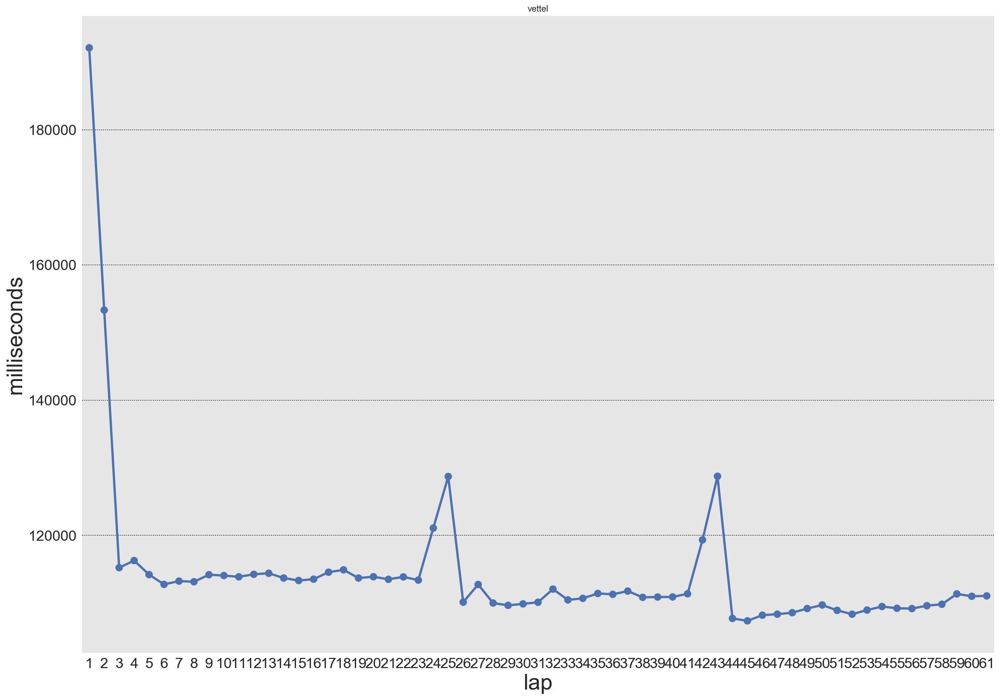

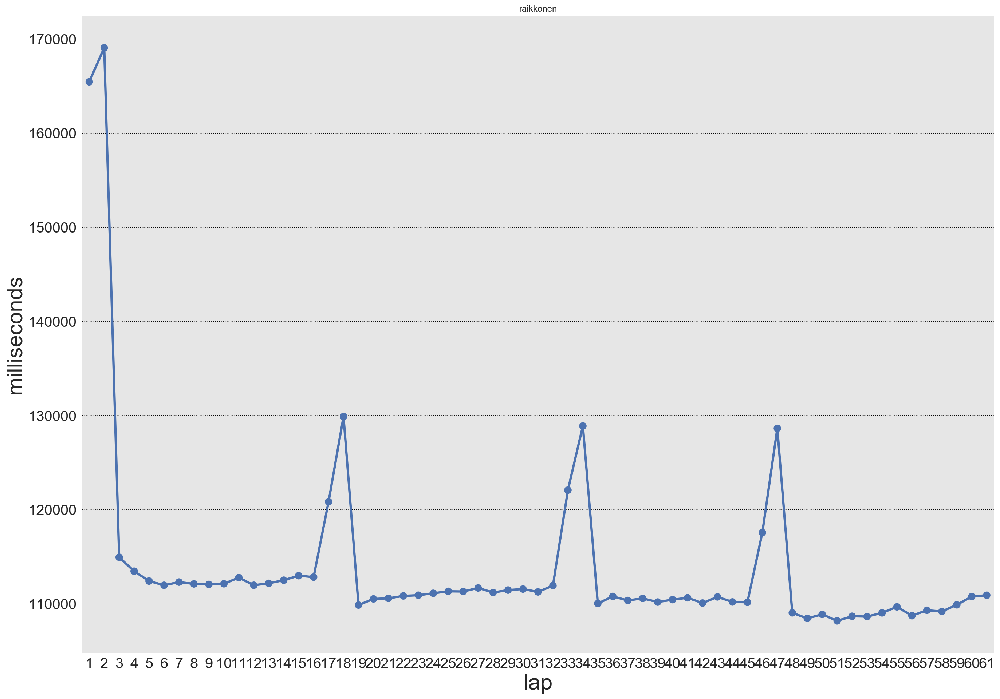

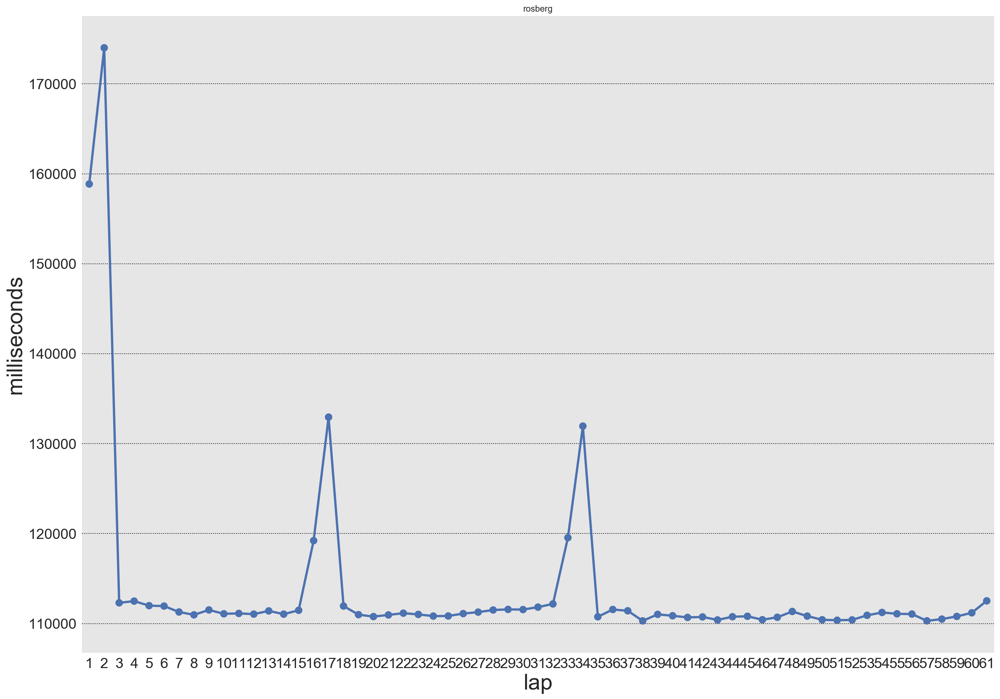

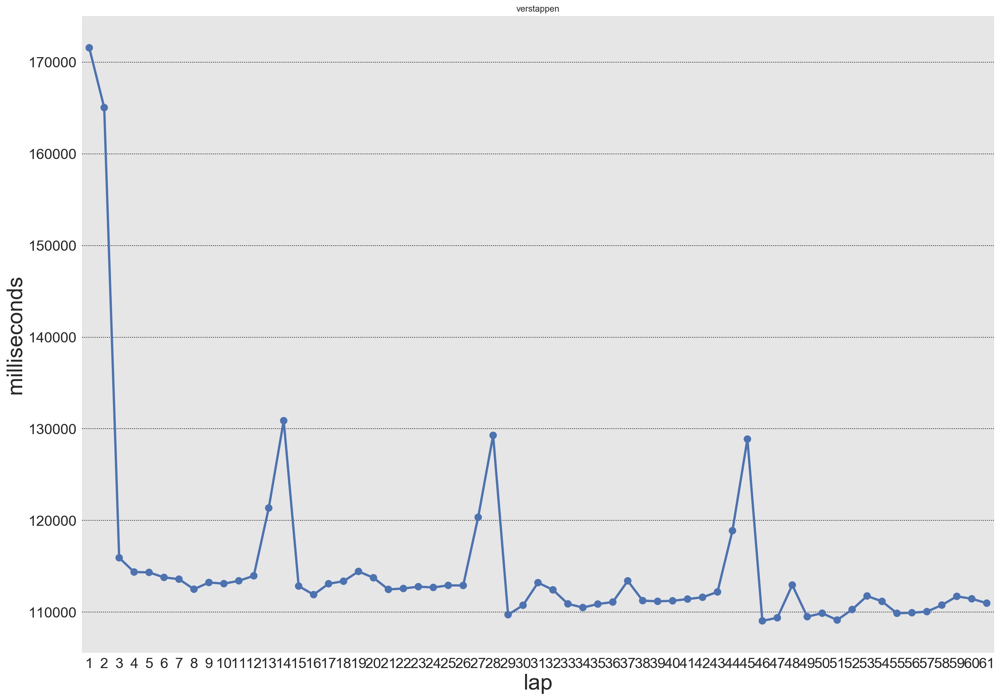

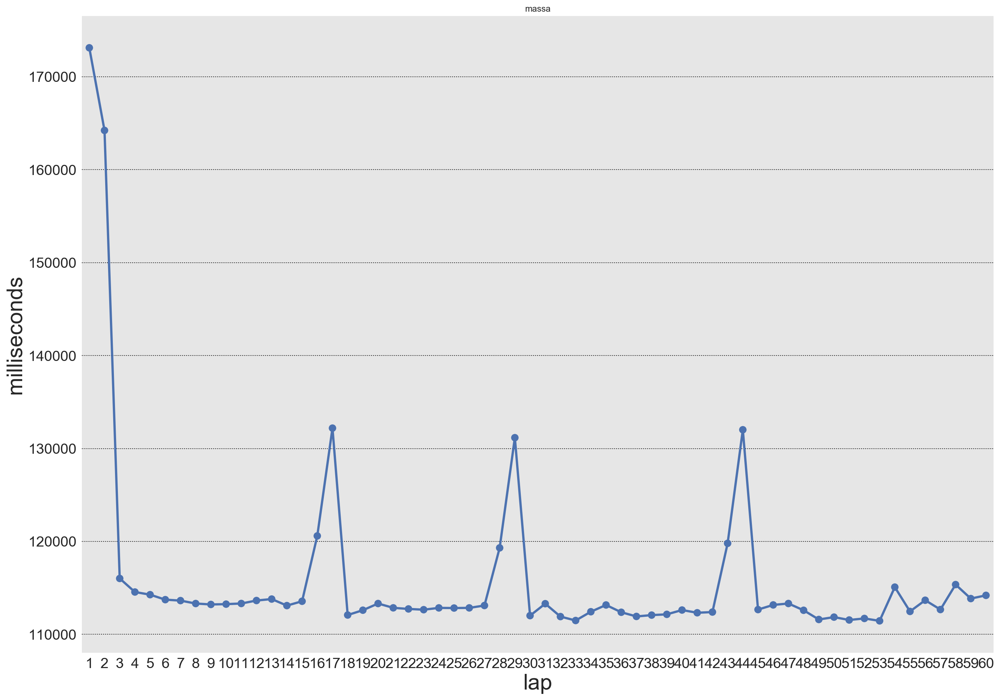

...

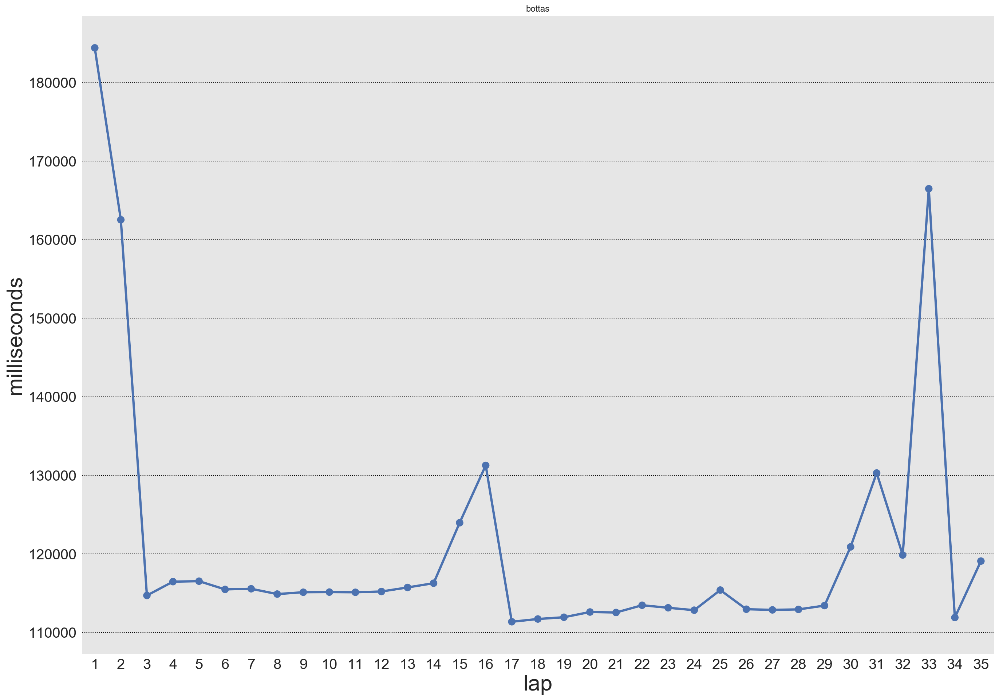

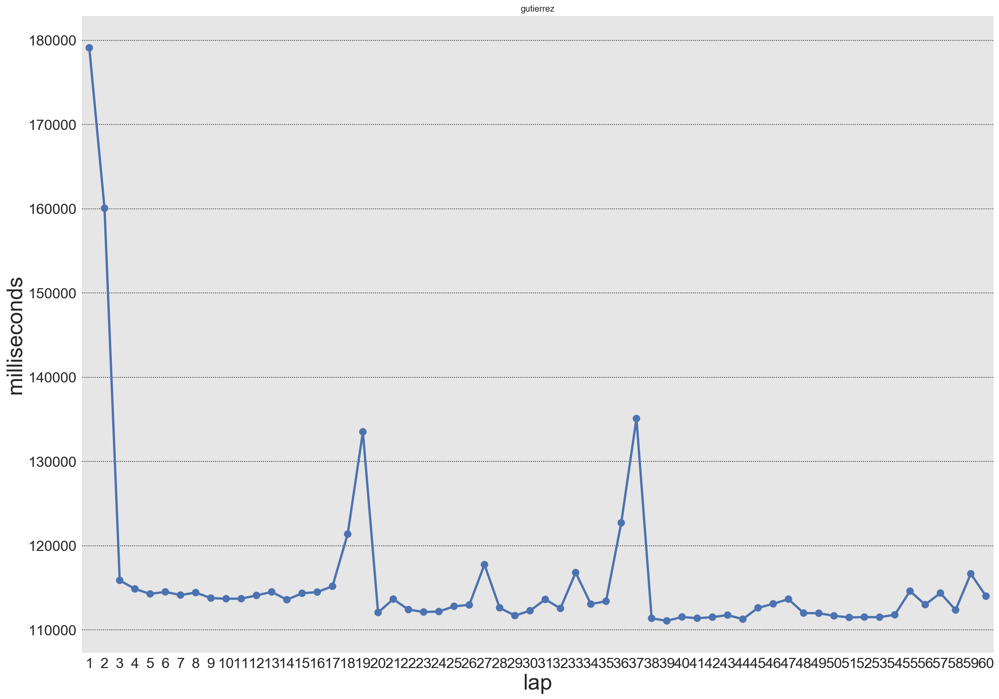

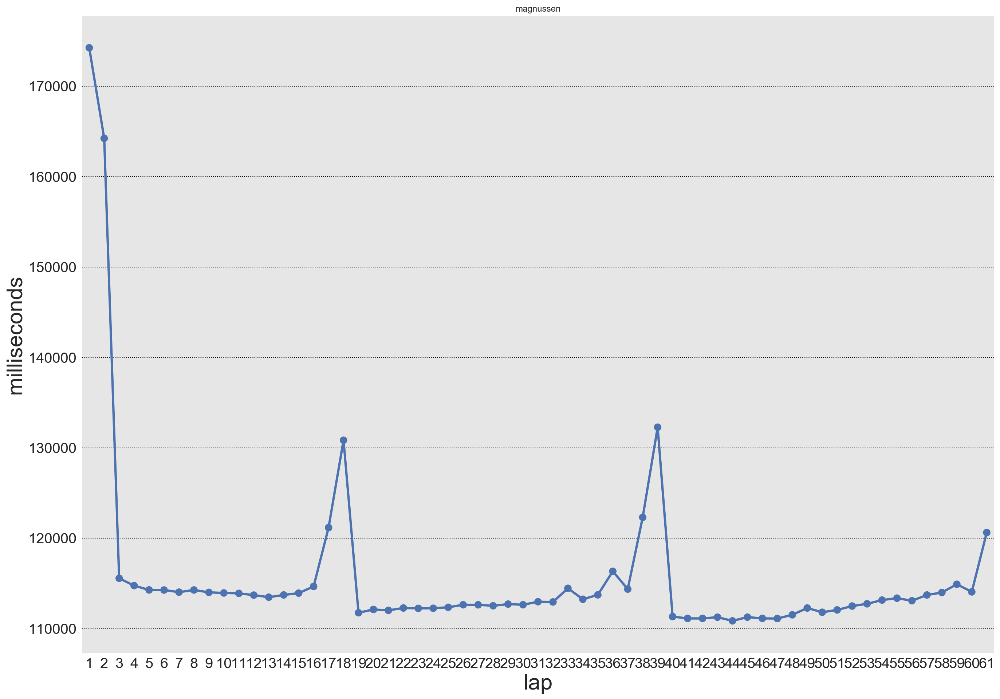

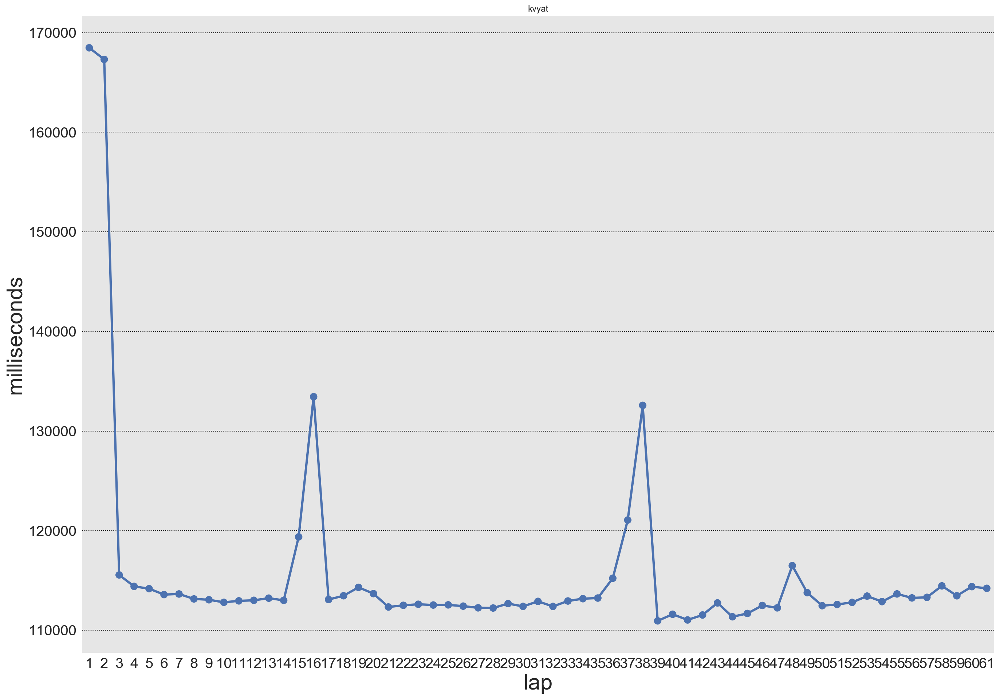

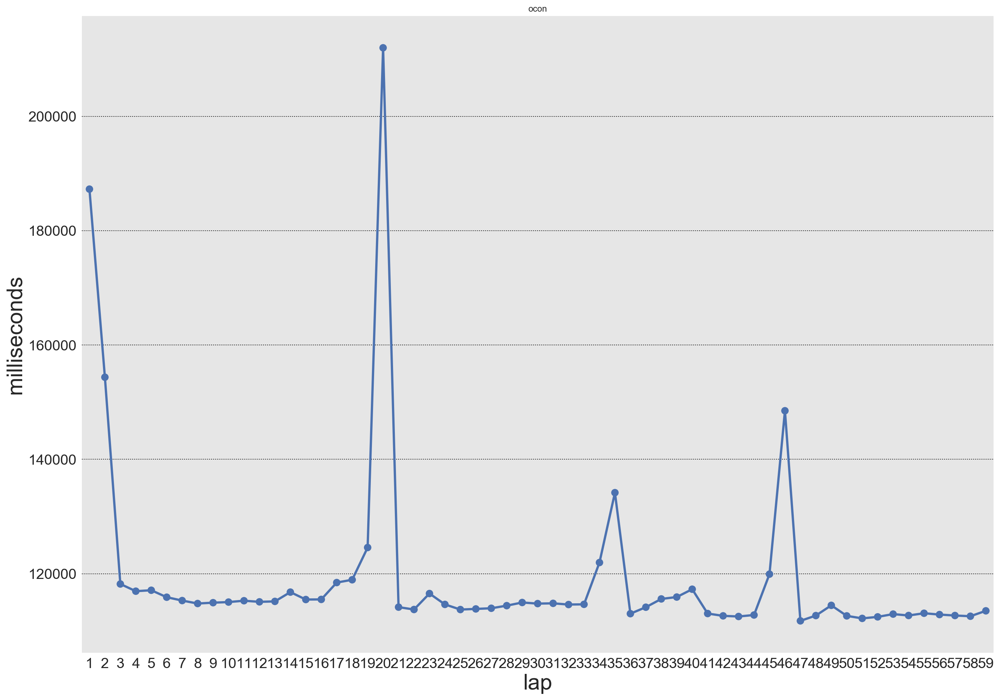

In [32]:
laptime_chart(SGP_2016, ylabel = 'Lap Time(s)', xlabel = "Lap Time(s)")

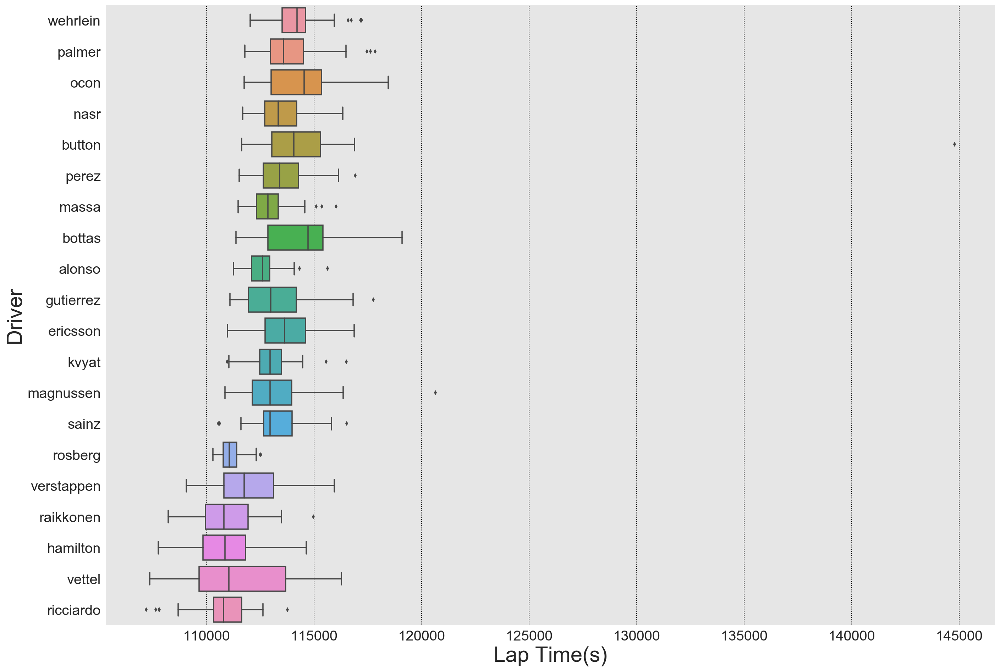

In [44]:
time_box_plot(SGP_2016, SGP_2016_tyres, df_pitStops, df_status, time_field='milliseconds', id_field='driverRef', title = '', ylabel = 'Driver', xlabel = "Lap Time(s)")

### OVERTAKING

In [45]:
df_overtaking = read_from_pickle(directory, "overtaking.pickle")

In [46]:
# Since Pit: Full laps since the overtaking driver pitted or started the race
# Until Pit: Full laps until the overtaking driver next pitted or finished the race
# Pit Diff: Difference in number of laps since each driver has pitted or started
# Since Pit: Full laps since the overtaken driver pitted or started the race
# Until Pit: Full laps until the overtaken driver next pitted or finished the race

def overtaking_preprocessing(df):
    
    df = df.rename(columns={ 0:'lap', 1:'position', 2:'overtaker', 3:'overtaker: since pit', 4:'overtaker: until pit', \
                                                   5:'pit diff', 6:'overtaken', 7:'overtaken: since pit', 8:'overtaken: until pit'})

    df['lap'] = df['lap'].astype(int)
    
    df_overtaken = df.loc[:,["lap","position","overtaker","overtaker: since pit","overtaker: until pit","name","year"]]
    df_overtaker = df.loc[:,["lap","position","overtaken","overtaken: since pit","overtaken: until pit","name","year"]]
    df_new = pd.concat([df_overtaken, df_overtaker])
    
    df_new["clear lap?"] = ["overtaken" if pd.isnull(row['overtaker']) else "overtaker" for index,row in df_new.iterrows()]
    df_new['overtaken'] = df_new['overtaken'].fillna(df_new['overtaker'])
    df_new['overtaken: since pit'] = df_new['overtaken: since pit'].fillna(df_new['overtaker: since pit'])
    df_new['overtaken: until pit'] = df_new['overtaken: until pit'].fillna(df_new['overtaker: until pit'])
    df_new = df_new.rename(columns={ "overtaken" :'driverRef', "overtaken: since pit": "since pit", 'overtaken: until pit': "until pit"})
    
    df_new['driverRef'] = df_new['driverRef'].str.normalize('NFKD').str.encode('ascii', errors='ignore').str.decode('utf-8')
    df_new['driverRef'] = [row.split(' ', 1 )[1].lower() for row in df_new['driverRef']]
    #df_new['driverId'] = df_new['driverRef'].map(drivers_dict)
    df_new['year'] = pd.to_numeric(df_new['year'], errors='coerce')
    df_new = df_new.drop(['overtaker', 'overtaker: since pit', 'overtaker: until pit'], axis=1)
    
    df_new = pd.merge(df_new, df_races[['raceId','name', 'year']], on=['name', 'year'], how="left")
    
    return df_new

In [47]:
df_overtaking_preprocessed = overtaking_preprocessing(df_overtaking)
df_overtaking_preprocessed.to_pickle(os.path.join(directory,"df_overtaking_preprocessed.pickle"))
df_overtaking_preprocessed.head()

,lap,name,driverRef,since pit,until pit,position,year,clear lap?,raceId
0,4,Australian Grand Prix,hamilton,3.0,12,5.0,2016,overtaker,948.0
1,5,Australian Grand Prix,ricciardo,4.0,7,8.0,2016,overtaker,948.0
2,5,Australian Grand Prix,bottas,4.0,12,16.0,2016,overtaker,948.0
3,9,Australian Grand Prix,bottas,8.0,8,14.0,2016,overtaker,948.0
4,10,Australian Grand Prix,ricciardo,9.0,2,6.0,2016,overtaker,948.0


## Derive tyre degradation profile

In [315]:
def segreate_used_fresh_tyres(df):
    
    df= df[df['tyre'] != "None"]
    
    print "Total number of stints per season: "
    print df.groupby('year')['tyre'].count()
    print "---------------------------------"
    
    df_fresh = df[~df['tyre'].isin(["Used Ultra soft", "Used Super soft", "Used Soft", "Used Medium", "Used Hard", "Used Intermediate", "Used Wet"])]
    df_used = df[df['tyre'].isin(["Used Ultra soft", "Used Super soft", "Used Soft", "Used Medium", "Used Hard", "Used Intermediate", "Used Wet"])]

    print "Total number of stints which ran on fresh tyres: "
    print df_fresh.groupby('year')['tyre'].value_counts()
    print "-----------------------------------------------"
    
    print "Total number of stints which ran on used tyres: "
    print df_used.groupby('year')['tyre'].value_counts()
    print "-----------------------------------------------"
    
    return df_fresh, df_used

In [49]:
# Filter only drivers with the same stint lengths within a 'group'

def find_percentile_range(x):
    
    pH, pL = np.percentile(x, [60 ,40])
    iqrtime = pH - pL       

    return round(pL), round(pH)

def find_sim_length(df):
    df = df[df['value'] >= 6]
    stints = pd.DataFrame(df.groupby(['name', 'stint', 'tyre'])['value'].apply(find_percentile_range)).reset_index()
    stints.rename(columns={"value": "range"}, inplace=True)
    stints[['lower', 'higher']] = stints['range'].apply(pd.Series)
    sim_length = pd.merge(df, stints, on =['name', 'stint', 'tyre'], how='left')
    sim_length = sim_length[sim_length['tyre'] != "None"]
    for i,row in sim_length.iterrows():
        if (sim_length.loc[i,"value"] >= sim_length.loc[i,"lower"]) & (sim_length.loc[i,"value"] <= sim_length.loc[i,"higher"]):
            sim_length.loc[i,"to use"] = "yes"
        else:
            sim_length.loc[i,"to use"] = "no"
            
    for i,row in sim_length.iterrows():
        if (sim_length.loc[i,"value"] >= sim_length.loc[i,"lower"]) & (sim_length.loc[i,"value"] <= sim_length.loc[i,"higher"]):
            sim_length.loc[i,"to use"] = "yes"
        else:
            sim_length.loc[i,"to use"] = "no"
    
    stints['year'] = df['year'].values[0]
    sim_length['year'] = df['year'].values[0]
    
    stints['range length'] = stints['higher'] - stints['lower']
    stints['mean'] = (stints['higher'] + stints['lower']) / 2
    stints = stints.drop(['range', 'lower', 'higher'], axis=1)
    
    sim_length = sim_length.drop(['range', 'lower', 'higher'], axis=1)

    print sim_length['year'].values[0]
    print sim_length['to use'].value_counts()
    print "-------------------"
    print sim_length['to use'].value_counts() / len(sim_length['to use'])
    
    sim_length = sim_length[sim_length['to use'] == 'yes']
    
    return stints, sim_length.sort_values(['stint',"name"])

In [50]:
def center_startlap_to_0(df):
    
    top10first = df.groupby(['name', 'driverRef', 'tyre', 'stint']).first().reset_index()
    top10first.rename(columns={'milliseconds':'ms(start at 0)'}, inplace=True)
    top10first.rename(columns={'lap':'lap(start of stint)'}, inplace=True)
    top10 = pd.merge(df, top10first[['lap(start of stint)','name', 'driverRef', 'tyre', 'stint','ms(start at 0)']], on=['name', 'driverRef', 'tyre', 'stint'], how='left')
    top10['milliseconds new'] = top10['milliseconds'] - top10['ms(start at 0)']
    top10['lap into stint'] = top10['lap'] - top10['lap(start of stint)']
    
    return top10

def tyre_degrad_preprocess(df_lapTimes, tyres, year, race_name, driver, filtered=True, with_unfinished_stints=False, clear_laps=False, minimum=1, race_leaders_only=False, top10_only=False):
    
    df = filter_laptimes(df_lapTimes, year, race_name, driver)
    df_tyres = tyre_use_race(tyres, year, race_name, driver)
    
    df_filtered = filter_pitlap_inlap_outlap(df, df_pitStops)
    df_filtered = df_filtered[df_filtered['lap'] != 1] # remove first lap
        
    if (filtered == False) & (with_unfinished_stints == True):
        df_new = tyre_use_race_laptimes(df, df_tyres)
        
    elif (filtered == True) & (with_unfinished_stints == True):
        df_new = tyre_use_race_laptimes(df_filtered, df_tyres)
        
    elif (filtered == True) & (with_unfinished_stints == False):
        nounfstints = no_unfinished_stints(df_tyres, df_status)
        df_new = tyre_use_race_laptimes(df_filtered, nounfstints)

    # Filter laps of race leaders only
    if race_leaders_only == True:
        df_new = df_new[df_new['position'] == 1]
        
    # Filter laps of top 10 positioned drivers at start of the stint 
    top10pos = range(1,11)
    if top10_only == True:
        df_new = df_new[df_new.groupby(['name', 'driverRef', 'tyre', 'stint'])['position'].transform('first').isin(list(top10pos))]
        
    # Filter clean laps only, remove stints where driver overtook or was overtaken.
    if clear_laps == True:
        df_new = pd.merge(df_new, df_overtaking_preprocessed[['raceId', 'driverRef', 'lap', 'clear lap?']], on=['raceId', 'driverRef', 'lap'], how='left')
        df_new = df_new.groupby(['name', 'driverRef', 'tyre', 'stint']).filter(lambda x: x['clear lap?'].isnull().all())
    
    # A stint must be more than specified number of laps to be included in model
    if minimum:
        df_new = df_new.groupby(['name','driverRef', 'tyre', 'stint']).filter(lambda x: len(x) >= minimum)
        
    # Center laptime and lap into stint as 0
    df_new = center_startlap_to_0(df_new)

    return df_new

In [51]:
def tyre_degrad_preprocess_concat(df_lapTimes, tyres, year, race_names, driver, filtered=True, with_unfinished_stints=False, clear_laps=False, minimum=1, race_leaders_only=False, top10_only=False):
    
    df_all = pd.DataFrame()
    for i in race_names:
        try:
            df = tyre_degrad_preprocess(df_lapTimes, tyres, year, i, driver, filtered, with_unfinished_stints, clear_laps, minimum, race_leaders_only, top10_only)
        except:
            "none"
        df_all = pd.concat([df_all, df])
        
    return df_all

In [52]:
def indiv_polynomial_reg_POLYFIT(data, calc_r2=False, fuel_adj=False, show_plot=True, show_table=True, **kwargs):
    
    
    """Returns individual polynomial regression coefficients for each specified grouping"""
    min_point = []
    coeffs = []
    r2_scores = []
    gs = []
    lengths = []
    years = []
    all_eqns = pd.DataFrame()
    groupby_fields = []
    values = []
    
    if kwargs is not None:
        for key, value in kwargs.iteritems():
            groupby = data[value].unique()
            groupby_fields.append(groupby)
            values.append(value)
            
    for g in itertools.product(*groupby_fields):
        
        try:
            data_grouped = data.groupby(values).get_group(g).reset_index()
            gs.append(g) 
            years.append(data_grouped['year'][0])
            lengths.append(len(data_grouped.index))
            try:
                if calc_r2 == True:
                    f, R2 = plot_polyreg_curve(data_grouped, calc_r2, fuel_adj, show_plot)
                    coeffs.append(f) 
                    r2_scores.append(R2)
                    min_point.append(f.deriv().r)
                else:
                    f = plot_polyreg_curve(data_grouped, calc_r2, fuel_adj, show_plot)
                    coeffs.append(f) 
                    min_point.append(f.deriv().r)
            except:
                coeffs.append("none")
                r2_scores.append("none")
                min_point.append("none")
            
        except: 
            comment = "Did not run a full stint on this tyre during the race"
            gs.append(g) 
            years.append(data_grouped['year'][0])
            lengths.append("none")
            coeffs.append(comment)
            min_point.append(comment)
            if calc_r2 == True:
                r2_scores.append(comment)
        
        if calc_r2 == True:
            model = pd.DataFrame(
                                    {"group": gs,
                                     'coeffs': coeffs,
                                     'r2 score': r2_scores,
                                     'min point': min_point,
                                     'data points included': lengths,
                                     'year': years
                                    }
                                )
        else: 
            model = pd.DataFrame(
                        {"group": gs,
                         'coeffs': coeffs,
                         'min point': min_point,
                         'data points included': lengths,
                         'year': years
                        }
                    )
        
        grouping = pd.DataFrame(model['group'].values.tolist(), index=model.index, columns=values)
        
        model_new = model.join(grouping, how='outer')
        model_new = model_new.drop('group', axis=1)

    if show_table == True:
        return model_new 

In [53]:
def indiv_polynomial_reg_POLYFIT(data, calc_r2=False, fuel_adj=False, show_plot=True, show_table=True, **kwargs):
    
    
    """Returns individual polynomial regression coefficients for each specified grouping"""
    min_point = []
    coeffs = []
    r2_scores = []
    gs = []
    lengths = []
    years = []
    all_eqns = pd.DataFrame()
    groupby_fields = []
    values = []
    
    if kwargs is not None:
        for key, value in kwargs.iteritems():
            groupby = data[value].unique()
            groupby_fields.append(groupby)
            values.append(value)
            
    for g in itertools.product(*groupby_fields):
        
        try:
            data_grouped = data.groupby(values).get_group(g).reset_index()
            gs.append(g) 
            years.append(data_grouped['year'][0])
            lengths.append(len(data_grouped.index))
            try:
                if calc_r2 == True:
                    f, R2 = plot_polyreg_curve(data_grouped, calc_r2, fuel_adj, show_plot)
                    coeffs.append(f) 
                    r2_scores.append(R2)
                    min_point.append(f.deriv().r)
                else:
                    f = plot_polyreg_curve(data_grouped, calc_r2, fuel_adj, show_plot)
                    coeffs.append(f) 
                    min_point.append(f.deriv().r)
            except:
                coeffs.append("none")
                r2_scores.append("none")
                min_point.append("none")
            
        except: 
            comment = "Did not run a full stint on this tyre during the race"
            gs.append(g) 
            years.append(data_grouped['year'][0])
            lengths.append("none")
            coeffs.append(comment)
            min_point.append(comment)
            if calc_r2 == True:
                r2_scores.append(comment)
        
        if calc_r2 == True:
            model = pd.DataFrame(
                                    {"group": gs,
                                     'coeffs': coeffs,
                                     'r2 score': r2_scores,
                                     'min point': min_point,
                                     'data points included': lengths,
                                     'year': years
                                    }
                                )
        else: 
            model = pd.DataFrame(
                        {"group": gs,
                         'coeffs': coeffs,
                         'min point': min_point,
                         'data points included': lengths,
                         'year': years
                        }
                    )
        
        grouping = pd.DataFrame(model['group'].values.tolist(), index=model.index, columns=values)
        
        model_new = model.join(grouping, how='outer')
        model_new = model_new.drop('group', axis=1)

    if show_table == True:
        return model_new 

In [54]:
def plot_polyreg_curve(group, calc_r2=False, fuel_adj=False, show_plot=True):
    
    # get x and y vectors
    x = group['lap into stint']

    if fuel_adj == True:
        y = group['milliseconds (adj)']
    else:
        y = group['milliseconds new']

    # calculate polynomial
    z = np.polyfit(x, y, 2)
    f = np.poly1d(z)

    # calculate new x's and y's
    x_new = range(group['lap into stint'].min(), group['lap into stint'].max() +1)
    y_new = f(x_new)

    if show_plot == True:
        
        plt.figure(figsize=(20,10))
        plt.title("  Race: " + str(group['name'].unique()[0]) + \
                  "  Driver: " + str(group['driverRef'].unique()) + \
                  "  Stint: " + str(group['stint'].unique()[0]) + \
                  #"  Compound: " + str(group['compound'].unique()[0]) + \
                  "  Tyre: " + str(group['tyre'].unique()[0]))
        plt.plot(x, y,'o', x_new, y_new)
        plt.show()
    
    # Calculate R2 score
    if calc_r2 == True:
        R2 = r2_score(y, y_new)
        return f, R2
    else:
        return f

In [55]:
def plot_degradation_curves(tyre_degrad, column, group, label_1, label_2, label_3):

    plt.figure(figsize=(20,10))
    c_new = []
    model = tyre_degrad[tyre_degrad[column].notnull()].reset_index(drop=True)
    model = model[model[column] != "Did not run a full stint on this tyre during the race"].reset_index(drop=True)

    t = linspace(0, 30)
    coeffs = model[column]
    colors = ['#000000', '#FF0000', '#FF7F00', '#FFFF00', '#00FF00', '#0000FF', '#4B0082', '#C2B280',
              '#848482', '#008856', '#E68FAC', '#0067A5', '#F99379', '#604E97', '#F6A600', '#B3446C', 
              '#DCD300', '#882D17', '#8DB600', '#654522', '#E25822', '#2B3D26']

    c = [coeffs[i](t) for i in range(len(coeffs))]
    for i in c:
        i = i-i[0]
        c_new.append(i)
        
    for idx, item in enumerate(c_new):
        plt.plot(t, item, color=colors[idx], label=(model[label_1][idx], model[label_2][idx], model[label_3][idx]))
    
    if len(group) == 2:
        plt.title(str(model[group[0]].values[0]) + " ," + str(model[group[1]].values[0]))
    elif len(group) == 1:
        plt.title(model[group[0]].values[0])
        
    plt.xlabel('lap number', fontsize=18)
    plt.ylabel('ylabel', fontsize=16)
    plt.legend(loc='upper left')
    plt.show()

In [56]:
def plot_degradation_curves_ALL(df, column, group, label_1, label_2, label_3):
    
    model = df[df["coeffs"].notnull()].reset_index(drop=True)
    model = model[model["coeffs"] != "Did not run a full stint on this tyre during the race"].reset_index(drop=True)

    for key,g in model.groupby(group):
        plot_degradation_curves(g, column, group, label_1, label_2, label_3)

### 1) Extract laptimes of all drivers in 2015, 2016, 2017 with pitlaps/inlaps/outlaps filtered (min 6 laps, only completed stints)

In [61]:
df_TDPS_2016 = tyre_degrad_preprocess_concat(df_lapTimes, tyres, [2016], races_names_2016, "", clear_laps=False, minimum=6)

In [63]:
df_TDPS_2017 = tyre_degrad_preprocess_concat(df_lapTimes, tyres, [2017], races_names_2017, "", clear_laps=False, minimum=6)

In [64]:
# Important! Check that unfinished stints are removed
rus = df_TDPS_2016[(df_TDPS_2016['name'] == "Australian Grand Prix") & \
                   (df_TDPS_2016['driverRef'].isin(["kvyat"])) & \
                   (df_TDPS_2016['stint'].isin([2])) & \
                   (df_TDPS_2016['tyre'].isin(["Soft"]))]
rus

,raceId,driverId,lap,position,time,milliseconds,name,driverRef,pitlaps/inlaps/outlaps,year,...,constructorRef,stop,statusId,laps,tyre,stint,lap(start of stint),ms(start at 0),milliseconds new,lap into stint


### 2) Only select stints without occurrence of Safety Car
#### Do not simply filter out the Safety car laps, filter out the entire stint.

In [65]:
def filter_stints_woSC(sc_laps, df):
    
    sc_laps_YES = filter_SClaps(sc_laps, df)
    df_new = pd.merge(df, sc_laps_YES, on=['raceId', 'driverId', 'stint'], how='left')
    df_new = df_new[df_new['SC lap'] != "Yes"]
    
    return df_new

In [66]:
df_TDPS_2016_woSC = filter_stints_woSC(sc_laps, df_TDPS_2016)

In [67]:
df_TDPS_2017_woSC = filter_stints_woSC(sc_laps, df_TDPS_2017)

In [68]:
# Important! Check that stints where Safety Car appeared are removed
sgp = df_TDPS_2017_woSC[(df_TDPS_2017_woSC['name'] == "Singapore Grand Prix") & \
                   (df_TDPS_2017_woSC['driverRef'].isin(["hamilton"])) & \
                   (df_TDPS_2017_woSC['stint'].isin([1]))]
sgp

,raceId,driverId,lap,position,time,milliseconds,name,driverRef,pitlaps/inlaps/outlaps,year,...,stop,statusId,laps,tyre,stint,lap(start of stint),ms(start at 0),milliseconds new,lap into stint,SC lap


In [301]:
# Findings: Eliminating stints with the appearance of the Safety Car eliminates stints on Wet and Intermediate tyres in both 2016 and 2017 
# All stints which ran on Wet and Intermediate tyres had the appearance of a Safety Car (with the exception of Int tyres in 2016).
print df_TDPS_2016_woSC[df_TDPS_2016_woSC['tyre'] == 'Wet'].raceId.unique()
print df_TDPS_2016_woSC[df_TDPS_2016_woSC['tyre'] == 'Intermediate'].raceId.unique()
print df_TDPS_2017_woSC[df_TDPS_2017_woSC['tyre'] == 'Wet'].raceId.unique()
print df_TDPS_2017_woSC[df_TDPS_2017_woSC['tyre'] == 'Intermediate'].raceId.unique()

[]
[953 967]
[]
[]


In [324]:
# Because of the already small sample size of Wet and Int tyres, 
# keep all Wet and Int stints even though the Safety Car appeared.
df_TDPS_2016_W_I = df_TDPS_2016[df_TDPS_2016['tyre'].isin(['Wet', 'Intermediate'])]
df_TDPS_2017_W_I = df_TDPS_2017[df_TDPS_2017['tyre'].isin(['Wet', 'Intermediate'])]          

### 3) Segregate stints which ran on fresh and used tyres

1. Medium tyres were only used in the Spanish Grand Prix in 2017, whereas it was used in many more races in 2016.
    - Sample size to measure degradation of Medium tyres is vastly different between 2016 and 2017.
    
2. Ultra soft tyres were introduced in 2016, but were used more often in 2017 than 2016. 
    - Ultra softs ran in the first stints only in 2017. 
    - Sample size to measure degradation of Medium tyres is not equal between 2016 and 2017.

In [316]:
# Statistics include stints with appearance of SC and unfinished stints
# Let's segregate the Used and Fresh tyres
# Compare between Used tyres in 2016 vs Used US in 2017, Fresh tyres in 2016 vs Fresh US in 2017
# Note: All Ultra softs are classified as "Used" in 2017
tm_fresh, tm_used = segreate_used_fresh_tyres(tm)

Total number of stints per season: 
year
2015    1053
2016    1281
2017     916
Name: tyre, dtype: int64
---------------------------------
Total number of stints which ran on fresh tyres: 
year  tyre        
2015  Soft            441
      Medium          335
      Super soft      144
      Hard             91
      Intermediate     42
2016  Soft            395
      Medium          186
      Super soft      153
      Wet             102
      Intermediate     55
      Hard             52
      Ultra soft       39
2017  Super soft      266
      Soft            241
      Ultra soft      110
      Wet              30
      Intermediate     20
      Medium           19
Name: tyre, dtype: int64
-----------------------------------------------
Total number of stints which ran on used tyres: 
year  tyre           
2016  Used Super soft    125
      Used Soft           92
      Used Ultra soft     46
      Used Medium         26
      Used Hard            7
      Used Wet             3
2017  

### 4) Only select similarly-lengthed stints of each tyre type within each race

4a) Fresh Tyres
- Only stints ran on fresh tyres are included in the measurement of interquartile range! 
- Statistics include stints with appearance of SC, does not include unfinished stints

In [320]:
tm_fresh_nounf = tm_fresh[tm_fresh['value'] != 0]
stints16, sim_length16 = find_sim_length(tm_fresh_nounf[tm_fresh_nounf['year'] == 2016])
stints17, sim_length17 = find_sim_length(tm_fresh_nounf[tm_fresh_nounf['year'] == 2017])

2016
no     529
yes    336
Name: to use, dtype: int64
-------------------
no     0.611561
yes    0.388439
Name: to use, dtype: float64
2017
no     337
yes    218
Name: to use, dtype: int64
-------------------
no     0.607207
yes    0.392793
Name: to use, dtype: float64


In [71]:
# Sample of dataframe showing the filter criteria.
stints17.head()

,name,stint,tyre,year,range length,mean
0,Abu Dhabi Grand Prix,1,Super soft,2017,0.0,28.0
1,Abu Dhabi Grand Prix,1,Ultra soft,2017,6.0,24.0
2,Abu Dhabi Grand Prix,2,Super soft,2017,2.0,33.0
3,Abu Dhabi Grand Prix,2,Ultra soft,2017,0.0,26.0
4,Australian Grand Prix,1,Soft,2017,0.0,15.0


In [345]:
df_TDPS_2017_W_I[df_TDPS_2017_W_I['tyre'] == "Wet"]

,raceId,driverId,lap,position,time,milliseconds,name,driverRef,pitlaps/inlaps/outlaps,year,...,constructorRef,stop,statusId,laps,tyre,stint,lap(start of stint),ms(start at 0),milliseconds new,lap into stint
102,982,13,5,14,2:14.039,134039,Singapore Grand Prix,massa,NaN,2017,...,williams,6.0,1.0,58.0,Wet,1.0,5,134039,0,0
103,982,13,6,14,2:13.230,133230,Singapore Grand Prix,massa,NaN,2017,...,williams,6.0,1.0,58.0,Wet,1.0,5,134039,-809,1
104,982,13,7,13,2:10.933,130933,Singapore Grand Prix,massa,NaN,2017,...,williams,6.0,1.0,58.0,Wet,1.0,5,134039,-3106,2
105,982,13,8,13,2:10.887,130887,Singapore Grand Prix,massa,NaN,2017,...,williams,6.0,1.0,58.0,Wet,1.0,5,134039,-3152,3
106,982,13,9,13,2:10.646,130646,Singapore Grand Prix,massa,NaN,2017,...,williams,6.0,1.0,58.0,Wet,1.0,5,134039,-3393,4
107,982,13,10,13,2:12.088,132088,Singapore Grand Prix,massa,NaN,2017,...,williams,6.0,1.0,58.0,Wet,1.0,5,134039,-1951,5
108,982,13,11,12,2:29.907,149907,Singapore Grand Prix,massa,NaN,2017,...,williams,6.0,1.0,58.0,Wet,1.0,5,134039,15868,6
109,982,13,12,10,2:45.468,165468,Singapore Grand Prix,massa,NaN,2017,...,williams,6.0,1.0,58.0,Wet,1.0,5,134039,31429,7
110,982,13,13,10,2:26.522,146522,Singapore Grand Prix,massa,NaN,2017,...,williams,6.0,1.0,58.0,Wet,1.0,5,134039,12483,8
111,982,13,14,10,2:53.048,173048,Singapore Grand Prix,massa,NaN,2017,...,williams,6.0,1.0,58.0,Wet,1.0,5,134039,39009,9


In [72]:
df_TDPS_2016_simlength = pd.merge(df_TDPS_2016_woSC, sim_length16, on=['year', 'name', 'driverRef', 'stint', 'tyre', 'constructorRef'], how='left')
df_TDPS_2016_simlength = df_TDPS_2016_simlength[df_TDPS_2016_simlength['to use'] == "yes"]
df_TDPS_2017_simlength = pd.merge(df_TDPS_2017_woSC, sim_length17, on=['year', 'name', 'driverRef', 'stint', 'tyre', 'constructorRef'], how='left')
df_TDPS_2017_simlength = df_TDPS_2017_simlength[df_TDPS_2017_simlength['to use'] == "yes"]

In [519]:
tm_fresh_nounf.to_pickle(os.path.join(directory,  "tm_fresh_nounf.pickle"))

4b) Used Tyres
- Only stints ran on used tyres are included in the measurement of interquartile range! 
- Statistics include stints with appearance of SC, does not include unfinished stints

In [318]:
tm_used_nounf = tm_used[tm_used['value'] != 0]
stints16_used, sim_length16_used = find_sim_length(tm_used_nounf[tm_used_nounf['year'] == 2016])
stints17_used, sim_length17_used = find_sim_length(tm_used_nounf[tm_used_nounf['year'] == 2017])

2016
yes    133
no     122
Name: to use, dtype: int64
-------------------
yes    0.521569
no     0.478431
Name: to use, dtype: float64
2017
no     108
yes     93
Name: to use, dtype: int64
-------------------
no     0.537313
yes    0.462687
Name: to use, dtype: float64


In [319]:
df_TDPS_2016_simlength_USED = pd.merge(df_TDPS_2016_woSC, sim_length16_used, on=['year', 'name', 'driverRef', 'stint', 'tyre', 'constructorRef'], how='left')
df_TDPS_2016_simlength_USED = df_TDPS_2016_simlength_USED[df_TDPS_2016_simlength_USED['to use'] == "yes"]
df_TDPS_2017_simlength_USED = pd.merge(df_TDPS_2017_woSC, sim_length17_used, on=['year', 'name', 'driverRef', 'stint', 'tyre', 'constructorRef'], how='left')
df_TDPS_2017_simlength_USED = df_TDPS_2017_simlength_USED[df_TDPS_2017_simlength_USED['to use'] == "yes"]

4c) Wet and Intermediate Tyres

In [325]:
df_TDPS_2016_simlength_W_I = pd.merge(df_TDPS_2016_W_I, sim_length16, on=['year', 'name', 'driverRef', 'stint', 'tyre', 'constructorRef'], how='left')
df_TDPS_2016_simlength_W_I = df_TDPS_2016_simlength_W_I[df_TDPS_2016_simlength_W_I['to use'] == "yes"]
df_TDPS_2017_simlength_W_I = pd.merge(df_TDPS_2017_W_I, sim_length17, on=['year', 'name', 'driverRef', 'stint', 'tyre', 'constructorRef'], how='left')
df_TDPS_2017_simlength_W_I = df_TDPS_2017_simlength_W_I[df_TDPS_2017_simlength_W_I['to use'] == "yes"]

### 5) Curve-fitting: Plot laptimes and derive coefficients and R2 score

5a) Fresh Tyres (Only similarly-lengthed stints for each tyre type)

In [73]:
tyre_degrad_2016 = indiv_polynomial_reg_POLYFIT(df_TDPS_2016_simlength, groupby_1_field="name", groupby_2_field='stint', \
                                                groupby_3_field='tyre', groupby_4_field='driverRef', \
                                                calc_r2=True, fuel_adj=False, show_plot=False, show_table = True)

In [74]:
tyre_degrad_2017 = indiv_polynomial_reg_POLYFIT(df_TDPS_2017_simlength, groupby_1_field="name", groupby_2_field='stint', \
                                                groupby_3_field='tyre', groupby_4_field='driverRef', \
                                                calc_r2=True, fuel_adj=False, show_plot=False, show_table = True)

In [75]:
tyre_degrad_2016.to_pickle(os.path.join(directory,"tyre_degrad_2016.pickle"))
tyre_degrad_2017.to_pickle(os.path.join(directory,"tyre_degrad_2017.pickle"))

5b) Used Tyres (Only similarly-lengthed stints for each tyre type)

In [321]:
tyre_degrad_2016_USED = indiv_polynomial_reg_POLYFIT(df_TDPS_2016_simlength_USED, groupby_1_field="name", groupby_2_field='stint', \
                                                groupby_3_field='tyre', groupby_4_field='driverRef', \
                                                calc_r2=True, fuel_adj=False, show_plot=False, show_table = True)

In [322]:
tyre_degrad_2017_USED = indiv_polynomial_reg_POLYFIT(df_TDPS_2017_simlength_USED, groupby_1_field="name", groupby_2_field='stint', \
                                                groupby_3_field='tyre', groupby_4_field='driverRef', \
                                                calc_r2=True, fuel_adj=False, show_plot=False, show_table = True)

In [326]:
tyre_degrad_2016_USED.to_pickle(os.path.join(directory,"tyre_degrad_2016_USED.pickle"))
tyre_degrad_2017_USED.to_pickle(os.path.join(directory,"tyre_degrad_2017_USED.pickle"))

5c) Wet and Intermediate Tyres (Only similarly-lengthed stints for each tyre type)

In [327]:
tyre_degrad_2016_W_I = indiv_polynomial_reg_POLYFIT(df_TDPS_2016_simlength_W_I, groupby_1_field="name", groupby_2_field='stint', \
                                                groupby_3_field='tyre', groupby_4_field='driverRef', \
                                                calc_r2=True, fuel_adj=False, show_plot=False, show_table = True)

In [328]:
tyre_degrad_2017_W_I = indiv_polynomial_reg_POLYFIT(df_TDPS_2017_simlength_W_I, groupby_1_field="name", groupby_2_field='stint', \
                                                groupby_3_field='tyre', groupby_4_field='driverRef', \
                                                calc_r2=True, fuel_adj=False, show_plot=False, show_table = True)

In [330]:
tyre_degrad_2016_W_I.to_pickle(os.path.join(directory,"tyre_degrad_2016_W_I.pickle"))
tyre_degrad_2017_W_I.to_pickle(os.path.join(directory,"tyre_degrad_2017_W_I.pickle"))

### 4) Remove the poorly fitted curves (Curves with R2 score less than 0.4) 

### 5) Remove the inverted u-curves 
- It is unlikely that during a stint, tyre degradation follows an inverted u-curve. I will remove these "rouge" curves. 
- Omitted variables could be causing this:
    - Stint strategy (fast, slow, fast),
    - Traffic during race
    - Driver mistakes
    - Temperature changes of race track

In [339]:
def remove_curves(df, R2_score, filter_lowR2=False):
    
    df = df[df["coeffs"] != "none"].reset_index(drop=True)
    df = df[df["coeffs"] != "Did not run a full stint on this tyre during the race"].reset_index(drop=True)

    # Check if x2 coeff is negative
    for i,row in df.iterrows():
        if df.loc[i,'coeffs'][2] < 0:
            df.loc[i,'inverted'] = "neg"
        else:
            df.loc[i,'inverted'] = "pos"
            
    # Categorize R2 scores
    for i,row in df.iterrows():
        if df.loc[i,'r2 score'] < R2_score:
            df.loc[i,'r2 cat'] = "< " + str(R2_score)
        else:
            df.loc[i,'r2 cat'] = "> " + str(R2_score)

    # Filter out inverse U-curves
    df_noinv = df[df['inverted'] == "pos"]

    # Filter out poorly fitted curves
    if filter_lowR2 == True:
        df_noinv = df_noinv[df_noinv['r2 cat'] == "> " + str(R2_score)]

    # Print proportion of poorly fitted and inverse curves
    print str(df['year'].values[0]) + " season"
    print '------------------------------'
    print "total count: "+ str(len(df))
    print "proportion of inverse curves: "
    print df['inverted'].value_counts()
    print "proportion of poorly fitted curves: "
    print df['r2 cat'].value_counts()
    print '=============================='
    
    return df_noinv.sort_values('r2 score')

In [341]:
tyre_degrad_2016_clean = remove_curves(tyre_degrad_2016, 0.5, filter_lowR2=False)
tyre_degrad_2017_clean = remove_curves(tyre_degrad_2017, 0.5, filter_lowR2=False)

2016 season
------------------------------
total count: 161
proportion of inverse curves: 
pos    114
neg     47
Name: inverted, dtype: int64
proportion of poorly fitted curves: 
< 0.5    92
> 0.5    69
Name: r2 cat, dtype: int64
2017 season
------------------------------
total count: 106
proportion of inverse curves: 
pos    80
neg    26
Name: inverted, dtype: int64
proportion of poorly fitted curves: 
< 0.5    59
> 0.5    47
Name: r2 cat, dtype: int64


In [342]:
tyre_degrad_2016_USED_clean = remove_curves(tyre_degrad_2016_USED, 0.5, filter_lowR2=False)
tyre_degrad_2017_USED_clean = remove_curves(tyre_degrad_2017_USED, 0.5, filter_lowR2=False)

2016 season
------------------------------
total count: 64
proportion of inverse curves: 
pos    47
neg    17
Name: inverted, dtype: int64
proportion of poorly fitted curves: 
> 0.5    35
< 0.5    29
Name: r2 cat, dtype: int64
2017 season
------------------------------
total count: 53
proportion of inverse curves: 
pos    44
neg     9
Name: inverted, dtype: int64
proportion of poorly fitted curves: 
< 0.5    27
> 0.5    26
Name: r2 cat, dtype: int64


In [343]:
tyre_degrad_2016_W_I_clean = remove_curves(tyre_degrad_2016_W_I, 0.5, filter_lowR2=False)
tyre_degrad_2017_W_I_clean = remove_curves(tyre_degrad_2017_W_I, 0.5, filter_lowR2=False)

2016 season
------------------------------
total count: 27
proportion of inverse curves: 
neg    16
pos    11
Name: inverted, dtype: int64
proportion of poorly fitted curves: 
> 0.5    27
Name: r2 cat, dtype: int64
2017 season
------------------------------
total count: 7
proportion of inverse curves: 
pos    5
neg    2
Name: inverted, dtype: int64
proportion of poorly fitted curves: 
> 0.5    5
< 0.5    2
Name: r2 cat, dtype: int64


In [361]:
tyre_degrad_1617 = tyre_degrad_2016_clean.append(tyre_degrad_2017_clean).reset_index(drop=True)
tyre_degrad_1617_USED = tyre_degrad_2016_USED_clean.append(tyre_degrad_2017_USED_clean).reset_index(drop=True)
tyre_degrad_1617_W_I = tyre_degrad_2016_W_I_clean.append(tyre_degrad_2017_W_I_clean).reset_index(drop=True)

In [347]:
# Dataframe of drivers' contructor (team) names and ids for each race
dcr = pd.merge(df_results[['driverId', 'constructorId', 'raceId']], df_drivers[['driverId', 'driverRef']], on=['driverId'], how='left')
dcrm = pd.merge(dcr, df_races[['raceId', 'year', 'name']], on=['raceId'], how='left')
dcrm = pd.merge(dcrm, df_constructors[['constructorId', 'constructorRef']], on=['constructorId'], how='left')

In [362]:
# Concat dataframes of laptime profiles of Fresh tyres, Used tyres, Wet & Intermediate tyres
# Merge constructor names to drivers
tyre_degrad = pd.concat([tyre_degrad_1617, tyre_degrad_1617_USED, tyre_degrad_1617_W_I])
tyre_degrad = pd.merge(tyre_degrad, dcrm[['year', 'name', 'driverRef', 'constructorRef']], on=['year', 'name', 'driverRef'], how='left')

In [360]:
# Note: After concating the dataframes, there is a duplicate row for 2016 Monaco GP, hulkenberg Intermediate tyres for sint 2.
# Drop the duplciate row
tyre_degrad[tyre_degrad['tyre'] == "Intermediate"]

,coeffs,data points included,min point,r2 score,year,name,driverRef,tyre,stint,inverted,r2 cat,constructorRef,c1,c2,c3
112,"[22.974025974, -973.721278721]",13,[21.1917858851],0.939324,2016,Monaco Grand Prix,hulkenberg,Intermediate,2.0,pos,> 0.5,force_india,22.974026,-973.721279,873.780220
285,"[176.642857143, -2491.88095238]",8,[7.05344386036],0.551711,2016,British Grand Prix,haryanto,Intermediate,2.0,pos,> 0.5,manor,176.642857,-2491.880952,-1068.416667
287,"[19.619047619, -293.119047619]",8,[7.47026699029],0.721642,2016,British Grand Prix,verstappen,Intermediate,2.0,pos,> 0.5,red_bull,19.619048,-293.119048,-208.916667
289,"[813.595238095, -8347.4047619]",8,[5.12994937227],0.765466,2016,British Grand Prix,bottas,Intermediate,2.0,pos,> 0.5,williams,813.595238,-8347.404762,-5475.500000
290,"[164.785714286, -2018.54761905]",8,[6.12476520734],0.795465,2016,British Grand Prix,button,Intermediate,2.0,pos,> 0.5,mclaren,164.785714,-2018.547619,-1622.083333
291,"[259.5, -2295.04761905]",8,[4.42205706946],0.841258,2016,British Grand Prix,ricciardo,Intermediate,2.0,pos,> 0.5,red_bull,259.500000,-2295.047619,-1006.583333
292,"[1119.54166667, -10646.2083333]",8,[4.75471733224],0.855324,2016,British Grand Prix,raikkonen,Intermediate,2.0,pos,> 0.5,ferrari,1119.541667,-10646.208333,-5060.375000
294,"[979.196428571, -9503.00595238]",8,[4.85245129327],0.865813,2016,British Grand Prix,grosjean,Intermediate,2.0,pos,> 0.5,haas,979.196429,-9503.005952,-4198.791667
295,"[22.974025974, -973.721278721]",13,[21.1917858851],0.939324,2016,Monaco Grand Prix,hulkenberg,Intermediate,2.0,pos,> 0.5,force_india,22.974026,-973.721279,873.780220
296,"[542.337662338, -8594.85414585]",13,[7.92389570439],0.554532,2017,Singapore Grand Prix,hulkenberg,Intermediate,2.0,pos,> 0.5,renault,542.337662,-8594.854146,-23148.681319


In [365]:
tyre_degrad.drop(tyre_degrad.index[112], inplace=True)

### 4) With the 'clean' tyre degradation profiles of each driver,  derive the aggregated coefficients

In [80]:
class Polynomial:
    
    def __init__(self, *coefficients):
        """ input: coefficients are in the form a_n, ...a_1, a_0 
        """
        # for reasons of efficiency we save the coefficients in reverse order,
        # i.e. a_0, a_1, ... a_n
        self.coefficients = coefficients[::-1] # tuple is also turned into list
     
    # method to return the canonical string representation of a polynomial
    def __repr__(self):
        return "Polynomial" + str(self.coefficients)
    
    def __call__(self, x):    
        res = 0
        for index, coeff in enumerate(self.coefficients):
            res += coeff * x** index
        return res 
    
    def degree(self):
        return len(self.coefficients)
    
    @staticmethod
    def zip_longest(iter1, iter2, fillchar=None):    
        for i in range(max(len(iter1), len(iter2))):
            if i >= len(iter1):
                yield (fillchar, iter2[i])
            elif i >= len(iter2):
                yield (iter1[i], fillchar)
            else:
                yield (iter1[i], iter2[i])
            i += 1   
            
    def __add__(self, other):
        c1 = self.coefficients
        c2 = other.coefficients
        res = [sum(t) for t in Polynomial.zip_longest(c1, c2)]
        return Polynomial(*res)
    
    def __sub__(self, other):
        c1 = self.coefficients
        c2 = other.coefficients
        
        res = [t1-t2 for t1, t2 in Polynomial.zip_longest(c1, c2)]
        return Polynomial(*res)
    
    def derivative(self):
        derived_coeffs = []
        exponent = 1
        for i in range(1, len(self.coefficients)):
            derived_coeffs.append(self.coefficients[i] * exponent)
            exponent += 1
        return Polynomial(*derived_coeffs)
    
    def __str__(self):
        res = ""
        for i in range(len(self.coefficients)-1, -1, -1):
            res +=  str(self.coefficients[i]) + "x^" + str(i) + " + "
        if res.endswith(" + "):
            res = res[:-3]
        return res

In [81]:
def apply_operations_to_poly1d(df, group, aggregate=False, divide=False):
    
    df['c1'] = df['c2'] = df['c3'] = np.nan
    df[['c1', 'c2', 'c3']] = [x.c for x in df.coeffs]
    
    if aggregate==True:
        grouped = df.groupby(group, as_index=False)
        df2 = grouped.agg({'c1':'mean', 'c2':'mean', 'c3':'mean'})

        return df2

    if divide==True:
        df2 = pd.DataFrame()
        df2['c1'] = df['c1'] / df['ratio']
        df2['c2'] = df['c2'] / df['ratio']
        df2['c3'] = df['c3'] / df['ratio']
        df2['driverRef'] = df['driverRef']
        df2['name'] = df['name']
        df2['tyre'] = df['tyre']
        df2['stint'] = df['stint']
        
        return df2

In [82]:
from random import shuffle

colors = list(matplotlib.colors.cnames.values())
colors = sort([str(c) for c in colors])
colors = colors[0:100]
shuffle(colors)
cnames_new = { x: colors[idx] for idx,x in enumerate(colors) }

In [83]:
# Difficulty in splitting coeffs and putting it together as a poly1d object.

import matplotlib.cm as cm
from scipy import stats

def plot_degradation_curves_ALL_1(df, color_type, group, label_1, label_2):
    
    for key,g in df.groupby(group):
        plot_degradation_curves_1(g, color_type, group, label_1, label_2)
        
def plot_degradation_curves_1(model, color_type, group, label_1, label_2):

    plt.figure(figsize=(20,10))

    if color_type == "wheel":
        n = np.arange(100)
        ys = [i+n+(i*n)**2 for i in range(100)]
        colors = cm.rainbow(np.linspace(0, 1, len(ys)))
    else:
        colors = list(cnames_new.values())
    
    for idx,row in model.iterrows():
        p = Polynomial(model.loc[idx,'c1'], model.loc[idx,'c2'], model.loc[idx,'c3'])
        X = np.linspace(0, 30, 50, endpoint=True)
        F = p(X)
        F_new = []
        for i in F:
            i = i-F[0]
            F_new.append(i)
        plt.plot(X, F_new, color=colors[idx], label=(model[label_1][idx], model[label_2][idx]), linewidth=3.0)
    
    if len(group) == 2:
        plt.title(str(model[group[0]].values[0]) + " ," + str(model[group[1]].values[0]))
    elif len(group) == 1:
        plt.title(model[group[0]].values[0], fontsize=30)
        
    plt.xlabel('lap number', fontsize=20)
    plt.ylabel('time to complete a lap (centered to zero, in milliseconds))', fontsize=18)
    plt.legend(loc='upper left', fontsize=22)
    plt.show()

In [380]:
# Aggregate by year & constructor name & tyre type 

tyre_degrad_1617_TYRE_TEAM = apply_operations_to_poly1d(tyre_degrad, ['year', 'constructorRef', 'tyre'], \
                                                  aggregate=True, divide=False)

tyre_degrad_1617_TYRE_TEAM.head()

,year,constructorRef,tyre,c3,c2,c1
0,2016,ferrari,Intermediate,-5060.375000,-10646.208333,1119.541667
1,2016,ferrari,Medium,-373.981818,-159.991775,4.614605
2,2016,ferrari,Soft,306.604728,-63.653536,5.047472
3,2016,ferrari,Super soft,293.144479,-51.881321,11.827141
4,2016,ferrari,Used Soft,-96.678788,-135.695563,30.471320


In [381]:
# Aggregate by year & race name & tyre type

tyre_degrad_1617_TYRE_RACE = apply_operations_to_poly1d(tyre_degrad, ['year', 'name', 'tyre'], \
                                                        aggregate=True, divide=False)

tyre_degrad_1617_TYRE_RACE.head()

,year,name,tyre,c3,c2,c1
0,2016,Abu Dhabi Grand Prix,Soft,-291.301550,-30.745667,3.799076
1,2016,Abu Dhabi Grand Prix,Super soft,473.732800,-233.323606,23.166003
2,2016,Australian Grand Prix,Medium,598.135897,-103.638320,5.258075
3,2016,Australian Grand Prix,Soft,241.640533,-120.187862,11.641156
4,2016,Australian Grand Prix,Super soft,-161.658030,-454.847641,70.713961


In [382]:
# Aggregate by year & tyre type & stint

tyre_degrad_1617_TYRE_STINT = apply_operations_to_poly1d(tyre_degrad, ['year', 'tyre', 'stint'], \
                                                         aggregate=True, divide=False)
tyre_degrad_1617_TYRE_STINT.head()

,year,tyre,stint,c3,c2,c1
0,2016,Hard,1.0,-689.340415,-56.218203,2.157926
1,2016,Hard,2.0,-44.923052,-18.175773,6.232594
2,2016,Hard,3.0,390.521625,-19.626187,7.415174
3,2016,Intermediate,2.0,-2220.860806,-4571.116946,444.481872
4,2016,Medium,1.0,-1805.479181,-161.130973,6.921515


In [383]:
# Aggregate by year & tyre type

tyre_degrad_1617_TYRE = apply_operations_to_poly1d(tyre_degrad, ['year', 'tyre'], aggregate=True, divide=False)
tyre_degrad_1617_TYRE.head()

,year,tyre,c3,c2,c1
0,2016,Hard,-91.361427,-26.951961,5.589908
1,2016,Intermediate,-2220.860806,-4571.116946,444.481872
2,2016,Medium,-1946.896328,-321.028941,11.932709
3,2016,Soft,-329.234779,-135.788299,13.547530
4,2016,Super soft,-43.113966,-302.155400,45.421798


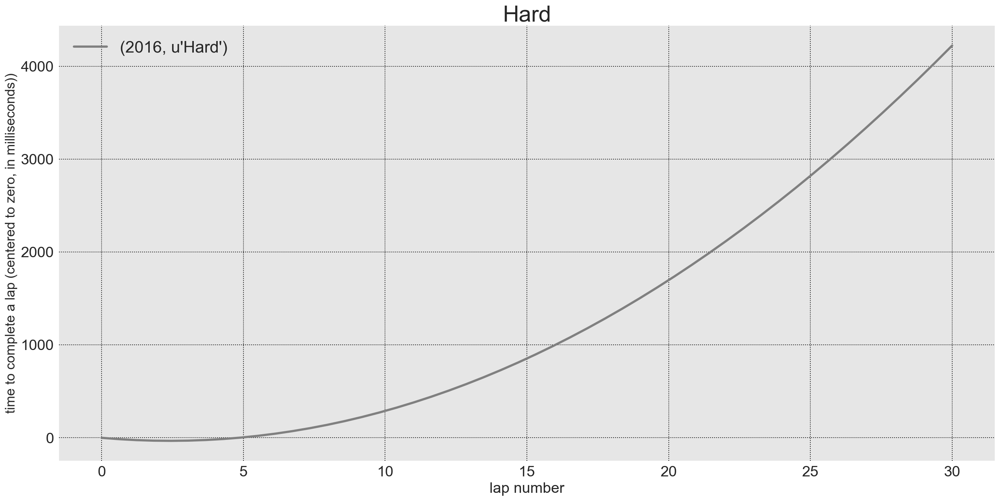

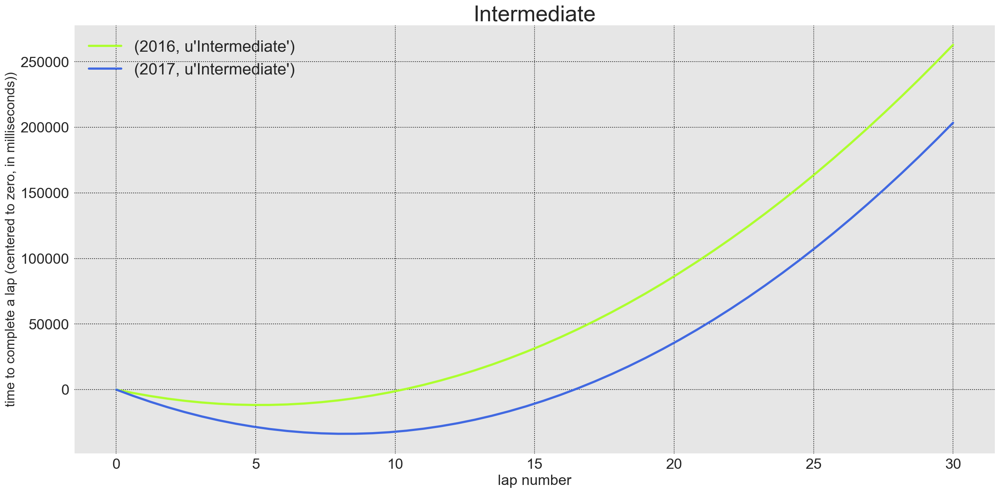

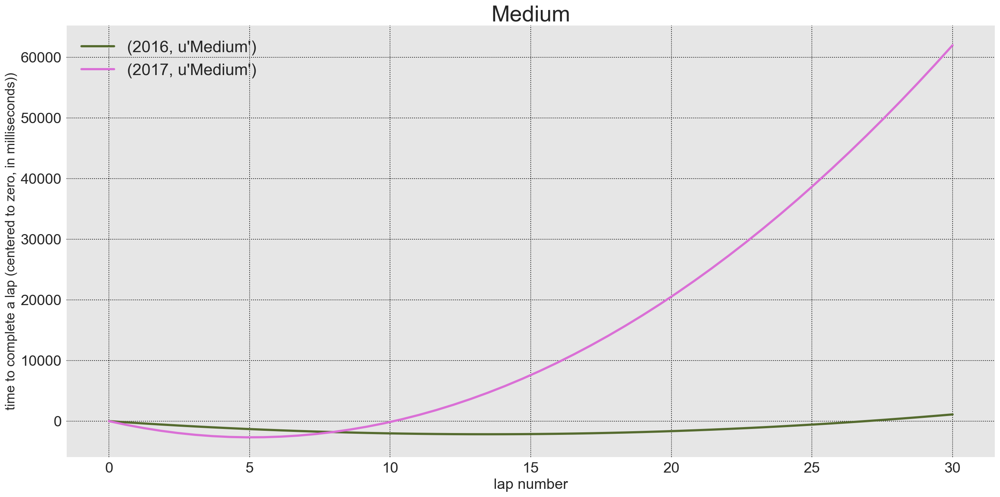

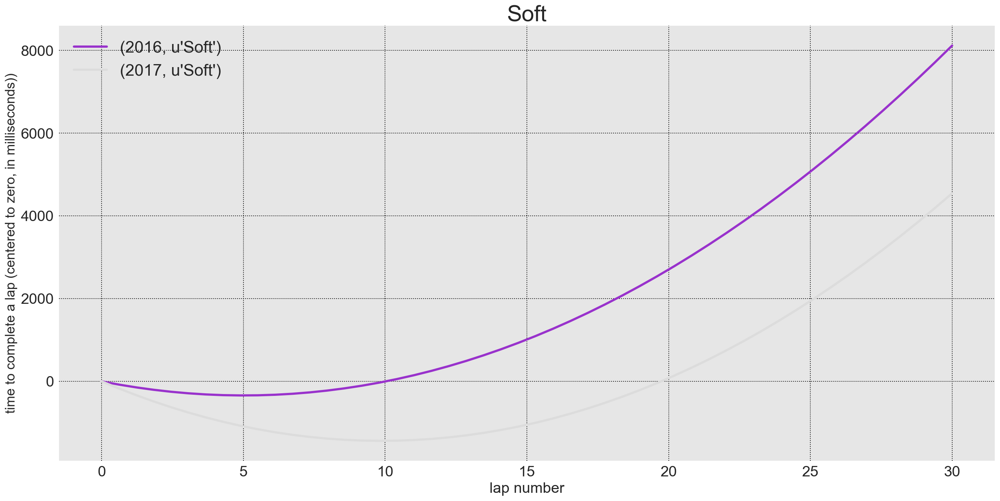

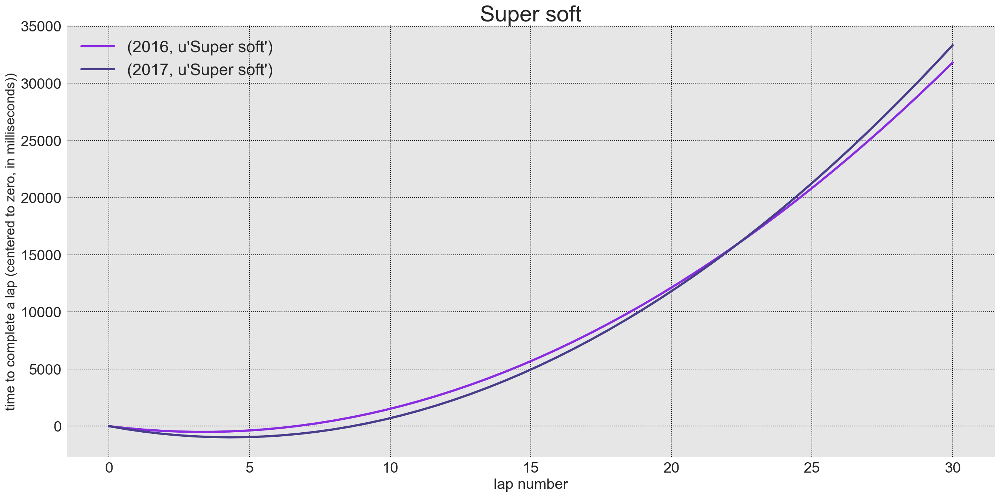

...

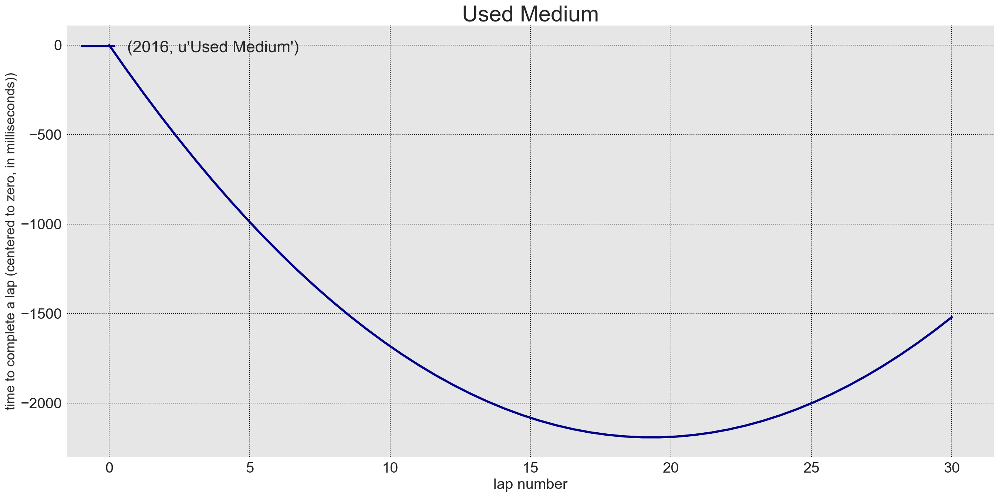

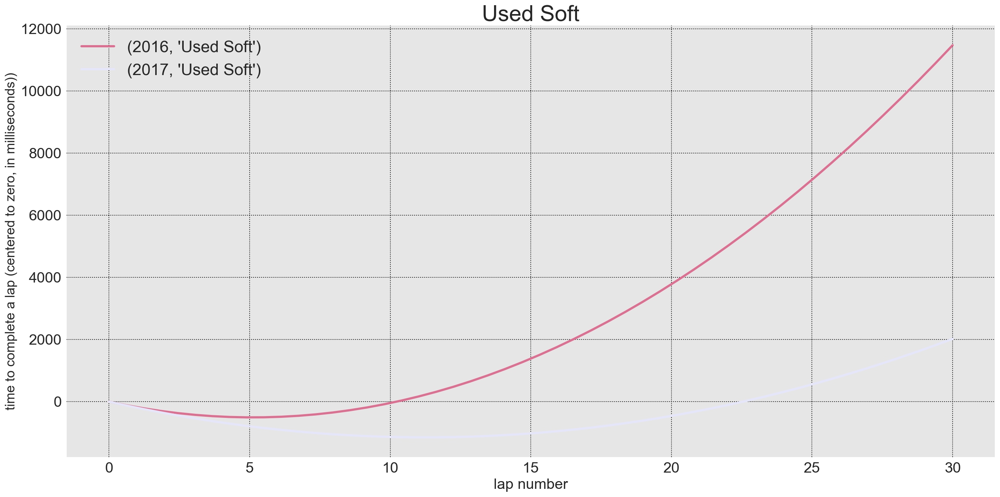

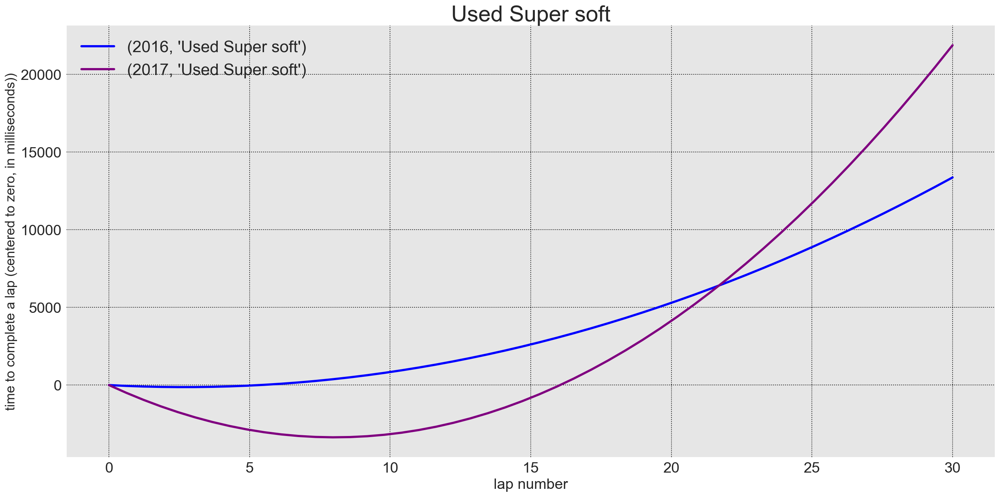

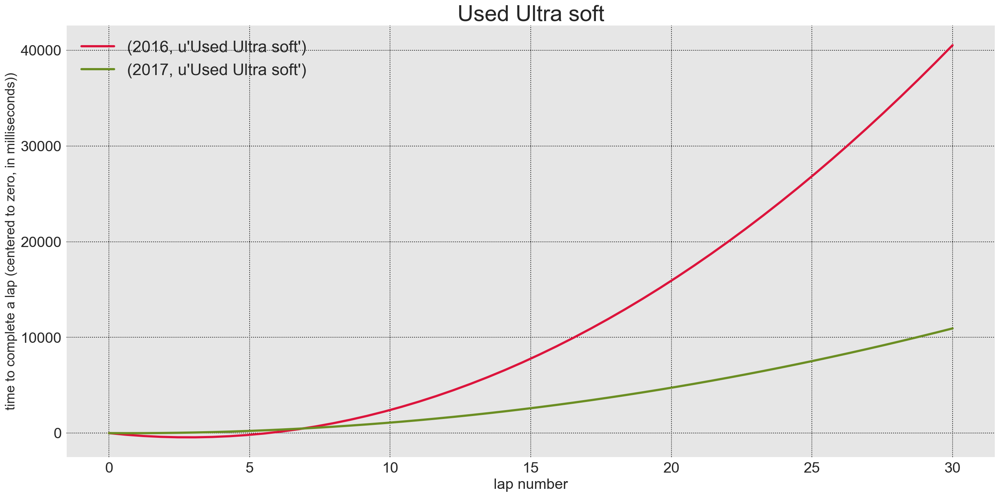

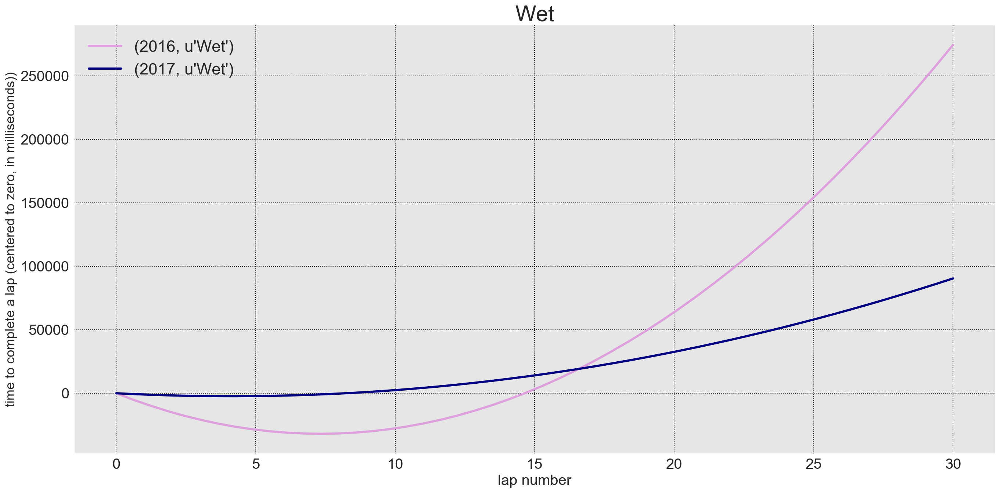

In [370]:
# Plot of tyre degradation rate of 2016 vs 2017 for each tyre type
# Findings: Super soft tyres seems to degrade faster in 2017 and provide a higher time advantage as compared to 2016.

plot_degradation_curves_ALL_1(tyre_degrad_1617_TYRE , "short", ['tyre'], 'year', 'tyre')

### 5) Calculate tyre degradation rating

In [180]:
from scipy.optimize import *

def find_derivative(model, color_type, group, label_1, label_2, label_3, show_plot):

    df_coeffs = pd.DataFrame()
    
    for idx,row in model.iterrows():
        p = Polynomial(model.loc[idx,'c1'], model.loc[idx,'c2'], model.loc[idx,'c3'])
        X = np.linspace(0, 30, 50, endpoint=True)
        p_der = p.derivative()
        F_derivative = p_der(X)

        df = pd.DataFrame(
                            {"slope": stats.linregress(X,F_derivative)[0],
                             'intercept': stats.linregress(X,F_derivative)[1],
                             'min point': minimize(p, 0).x[0],  # calculate the minimum point of the polynomial curve
                             str(label_1): model.loc[idx,str(label_1)],
                             str(label_2): model.loc[idx,str(label_2)],
                             str(label_3): model.loc[idx,str(label_3)]
                            }, index=[0]
                        )
        
        df_coeffs = pd.concat([df_coeffs, df])
        
        if show_plot == True:
            plt.plot(X, F_new, color=colors[idx], label=(model[label_1][idx], model[label_2][idx], model[label_3][idx]), linewidth=3.0)
    
    # Plot the time advantage slopes
    if show_plot == True:
        if len(group) == 2:
            plt.title(str(model[group[0]].values[0]) + " ," + str(model[group[1]].values[0]))
        elif len(group) == 1:
            plt.title(model[group[0]].values[0], fontsize=30)

        plt.xlabel('lap number', fontsize=20)
        plt.ylabel('time to complete a lap (centered to zero, in milliseconds))', fontsize=18)
        plt.legend(loc='upper left', fontsize=22)
        plt.show()

    return df_coeffs.reset_index(drop=True)

def find_derivative_ALL(df, color_type, group, label_1, label_2, label_3, show_plot):
    
    df_coeffs_ALL = pd.DataFrame()
    
    for key,g in df.groupby(group):
        df = find_derivative(g, color_type, group, label_1, label_2, label_3, show_plot)
        
        df_coeffs_ALL = pd.concat([df_coeffs_ALL, df])
        
    return df_coeffs_ALL.drop(['intercept'], axis=1).reset_index(drop=True)
        

In [513]:
pd.options.mode.chained_assignment = None

def calc_rates(df, baseline_idx1, baseline_idx2, year1, year2, group):
    
    der1 = df[df['year'] == year1]
    der2 = df[df['year'] == year2]
    
    # Degradation -> Min point
    der1['degrad rate'] = der1['min point'] / der1.loc[baseline_idx1, "min point"] 
    der2['degrad rate'] = der2['min point'] / der2.loc[baseline_idx2, "min point"]

    # Time Adv -> Slope
    der1['time adv rate'] = der1['slope'] / der1.loc[baseline_idx1, "slope"]
    der2['time adv rate'] = der2['slope'] / der2.loc[baseline_idx2, "slope"]
    
    derT = der1.append(der2)
    
    der1.rename(columns={"degrad rate": "degrad rate "+str(year1)}, inplace=True)
    der2.rename(columns={"degrad rate": "degrad rate "+str(year2)}, inplace=True)
    der1.rename(columns={"time adv rate": "time adv rate "+str(year1)}, inplace=True)
    der2.rename(columns={"time adv rate": "time adv rate "+str(year2)}, inplace=True)
    
    if len(group) == 2:
        der = pd.merge(der1[[group[0], group[1], "degrad rate "+str(year1), "time adv rate "+str(year1)]], \
                       der2[[group[0], group[1], "degrad rate "+str(year2), "time adv rate "+str(year2)]], \
                       on=group, how='left')
    else:
        der = pd.merge(der1[[group[0], "degrad rate "+str(year1), "time adv rate "+str(year1)]], \
                       der2[[group[0], "degrad rate "+str(year2), "time adv rate "+str(year2)]], \
                       on=group, how='left')

    return der, derT

#### 5a) Calculate degradation rating for each tyre type

In [487]:
TYRE_der = find_derivative_ALL(tyre_degrad_1617_TYRE, "short", ['tyre'], \
                               'year', 'tyre', 'tyre', show_plot=False)

In [488]:
tyre_short = {"Hard": "H", "Intermediate":"I", "Medium":"M", "Soft":"S", "Super soft":"SS", 
              "Ultra soft": "US", "Wet": "W", "Used Intermediate": "Used I", "Used Medium": "Used M",
              "Used Soft": "Used S", "Used Super soft": "Used SS", "Used Ultra soft": "Used US", 
              "Used Wet": "Used W", "Used Hard": "Used H"
             }

TYRE_der['tyre'].replace(tyre_short, inplace=True)

In [492]:
# Choose a row of the dataframe as the baseline
# Hard and Medium tyres are not a good choice for baseline because of the low sample size of these tyre types
# Choese the next Hardest option: Soft
idx1 = float(TYRE_der[(TYRE_der['tyre'] == "S") & (TYRE_der['year'] == 2016)].index.values[0])
idx2 = float(TYRE_der[(TYRE_der['tyre'] == "S") & (TYRE_der['year'] == 2017)].index.values[0])

In [493]:
TYRE, t = calc_rates(TYRE_der, idx1, idx2, 2016, 2017, group = ['tyre'])

In [514]:
TYRE

,tyre,degrad rate 2016,time adv rate 2016,degrad rate 2017,time adv rate 2017
0,H,0.481042,0.198485,NaN,NaN
1,I,1.026044,33.663555,0.832534,28.177947
2,M,2.684126,2.364187,0.513278,3.615067
3,S,1.000000,1.000000,1.000000,1.000000
4,SS,0.663688,2.225195,0.438694,1.546702
5,US,0.869350,1.142221,0.855712,1.131231
6,Used H,0.122731,0.124235,NaN,NaN
7,Used M,3.853002,1.672035,NaN,NaN
8,Used S,1.019934,1.456278,1.142049,0.698897
9,Used SS,0.533967,0.712322,0.812901,2.875899


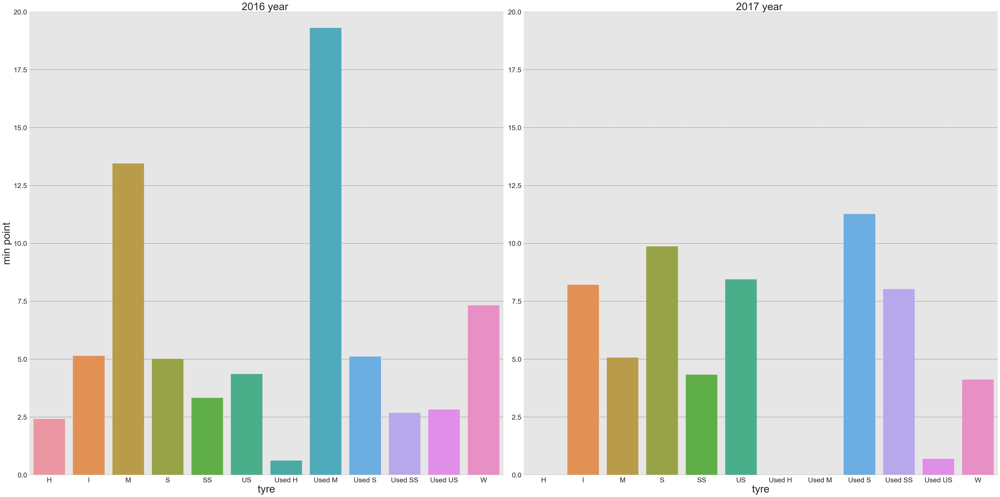

In [496]:
ax = sns.factorplot(x='tyre', y="min point", col='year', kind="bar", size=20, data=t)
ax.set_titles("{col_name} {col_var} ")
ax.set(ylim=(0, 20))

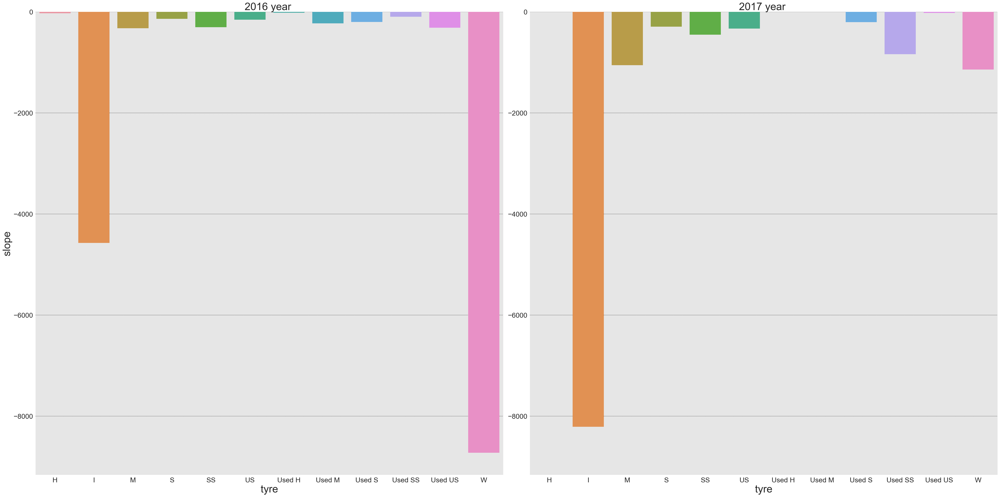

In [494]:
ax = sns.factorplot(x='tyre', y="slope", col='year', kind="bar", size=20, data=t)
ax.set_titles("{col_name} {col_var} ")

#### 5b) Calculate degradation rating for each tyre type per stint

In [375]:
TYRE_STINT_der = find_derivative_ALL(tyre_degrad_1617_TYRE_STINT, "short", ['stint'], \
                                     'year', 'tyre', 'stint', show_plot=False)

In [404]:
# Choose a row of the dataframe as the baseline
# Hard and Medium tyres are not a good choice for baseline because of the low sample size of these tyre types
# Choese the next Hardest option: Soft
idx1 = float(TYRE_STINT_der[(TYRE_STINT_der['tyre'] == "Soft") & (TYRE_STINT_der['year'] == 2016) & \
                      (TYRE_STINT_der['stint'] == 1)].index.values[0])
idx2 = float(TYRE_STINT_der[(TYRE_STINT_der['tyre'] == "Soft") & (TYRE_STINT_der['year'] == 2017) &\
                      (TYRE_STINT_der['stint'] == 1)].index.values[0])

In [427]:
TYRE_STINT, ts = calc_rates(TYRE_STINT_der, idx1, idx2, 2016, 2017, group = ['tyre', 'stint'])

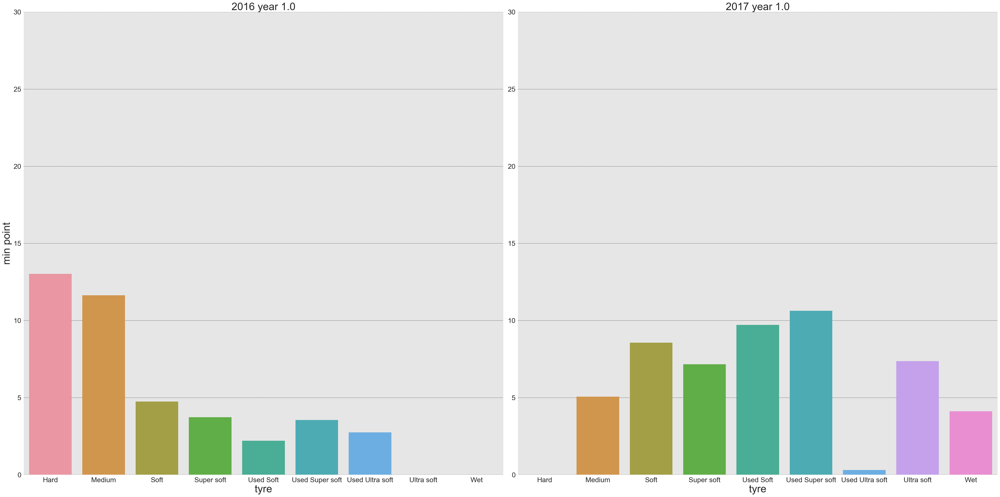

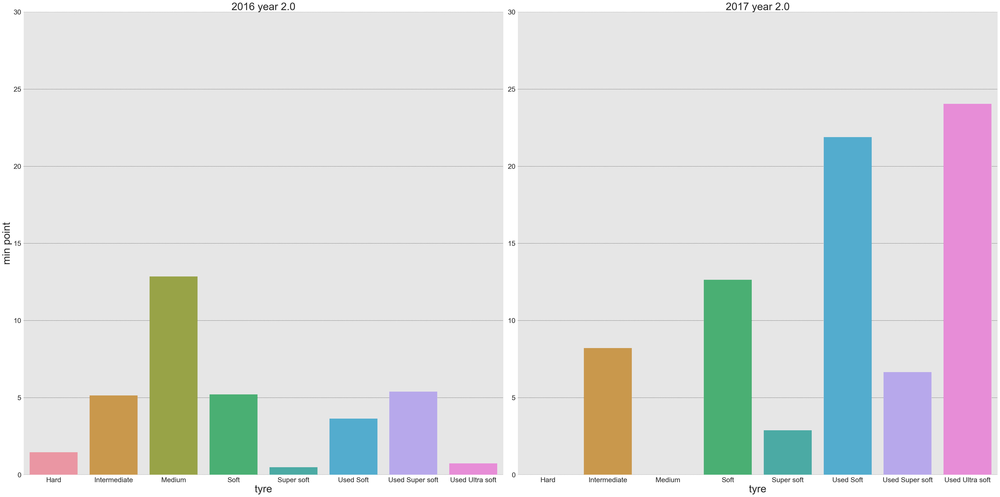

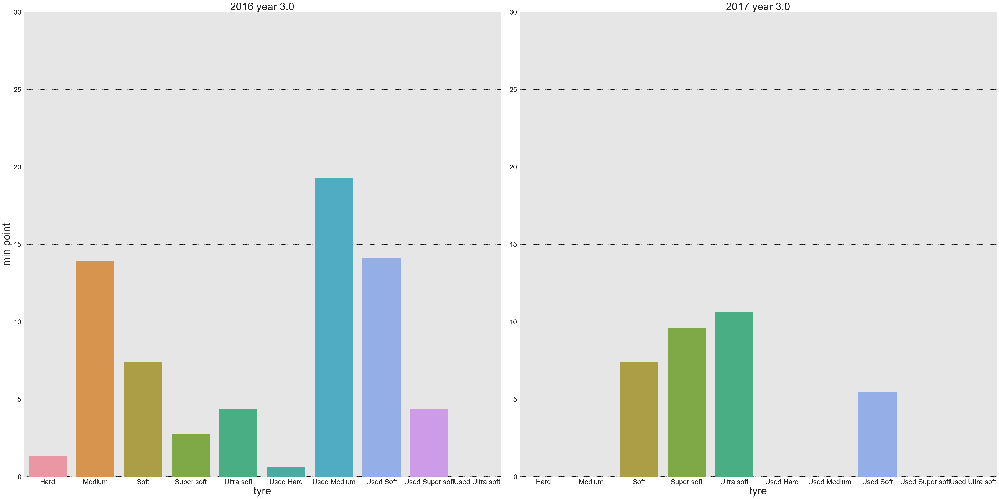

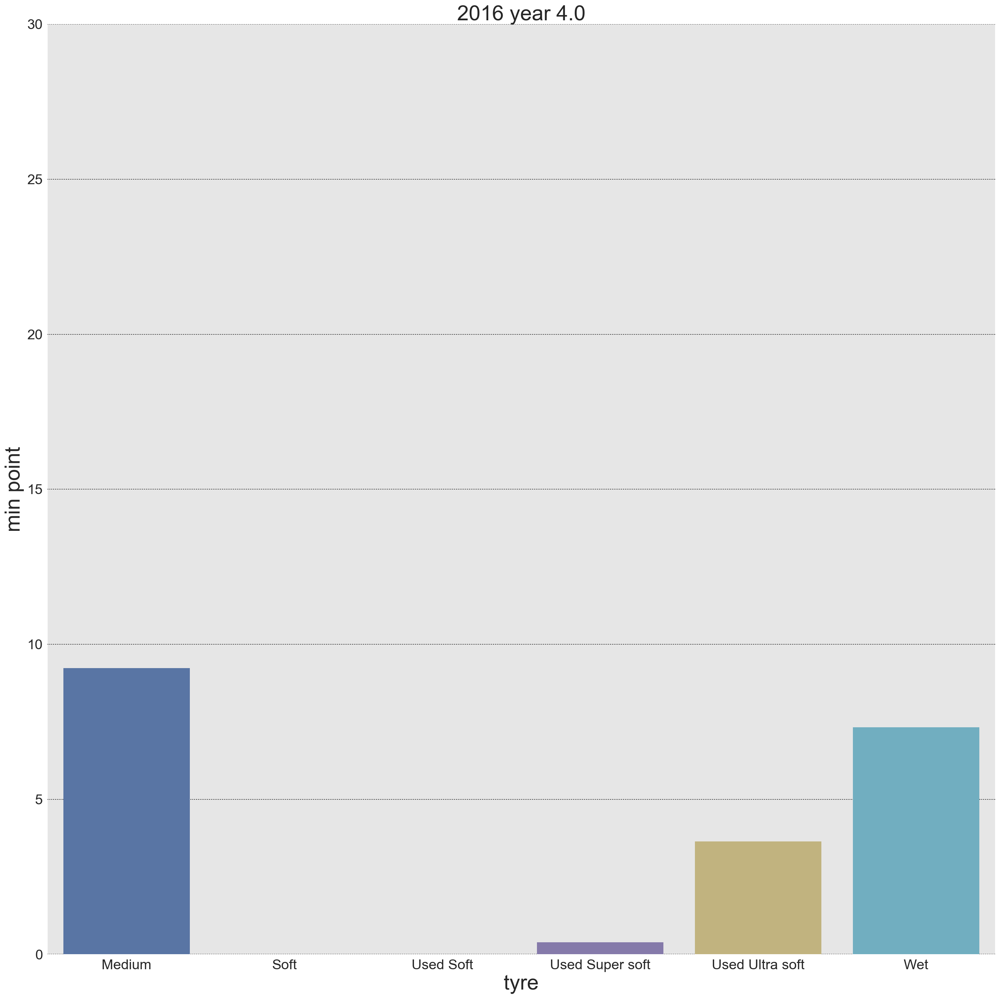

In [429]:
for i in ts.stint.unique():
    ax = sns.factorplot(x='tyre', y="min point", col='year', kind="bar", size=20, data=ts.groupby('stint').get_group(i))
    ax.set_titles("{col_name} {col_var} " + str(i))
    ax.set(ylim=(0, 30))

#### 5c) Calculate degradation rating for each tyre type per race

In [499]:
TYRE_RACE_der = find_derivative_ALL(tyre_degrad_1617_TYRE_RACE, "short", \
                                                     ['tyre'], 'year', 'tyre', 'name', show_plot=False)

In [500]:
race_short = {'Japanese Grand Prix': "JPN", 'Malaysian Grand Prix': "MAL", 'British Grand Prix': "GB",
               'Monaco Grand Prix': "MON", 'Singapore Grand Prix': "SG",
               'Australian Grand Prix': "AU", 'Bahrain Grand Prix': "BAH", 'Belgian Grand Prix': "BEL",
               'Chinese Grand Prix': "CHN", 'Italian Grand Prix': "ITA", 'Mexican Grand Prix': "MEX",
               'Spanish Grand Prix': "ES", 'United States Grand Prix': "USA",
               'Abu Dhabi Grand Prix': "ADE", 'Azerbaijan Grand Prix': "AZE",
               'Canadian Grand Prix': "CAN", 'Russian Grand Prix': "RUS", 'Brazilian Grand Prix': "BRZ",
               'Hungarian Grand Prix': "HUN", 'Austrian Grand Prix': "AT"}

TYRE_RACE_der['name'].replace(race_short, inplace=True)

In [505]:
# Filter dataframe to only show Fresh tyres + Used US
#TYRE_RACE_der_new = TYRE_RACE_der[TYRE_RACE_der['tyre'].isin(['Soft', 'Super soft', 'Used Ultra soft', 'Medium', 'Hard'])]

In [190]:
track_new_agg = read_from_pickle(directory, "track_new_agg.pickle")

tyre_degrad_1617_TYRE_RACE_der = pd.merge(tyre_degrad_1617_TYRE_RACE_der, track_new_agg[['name', 'Tyre stress', 'Number of laps']], on='name', how='left')

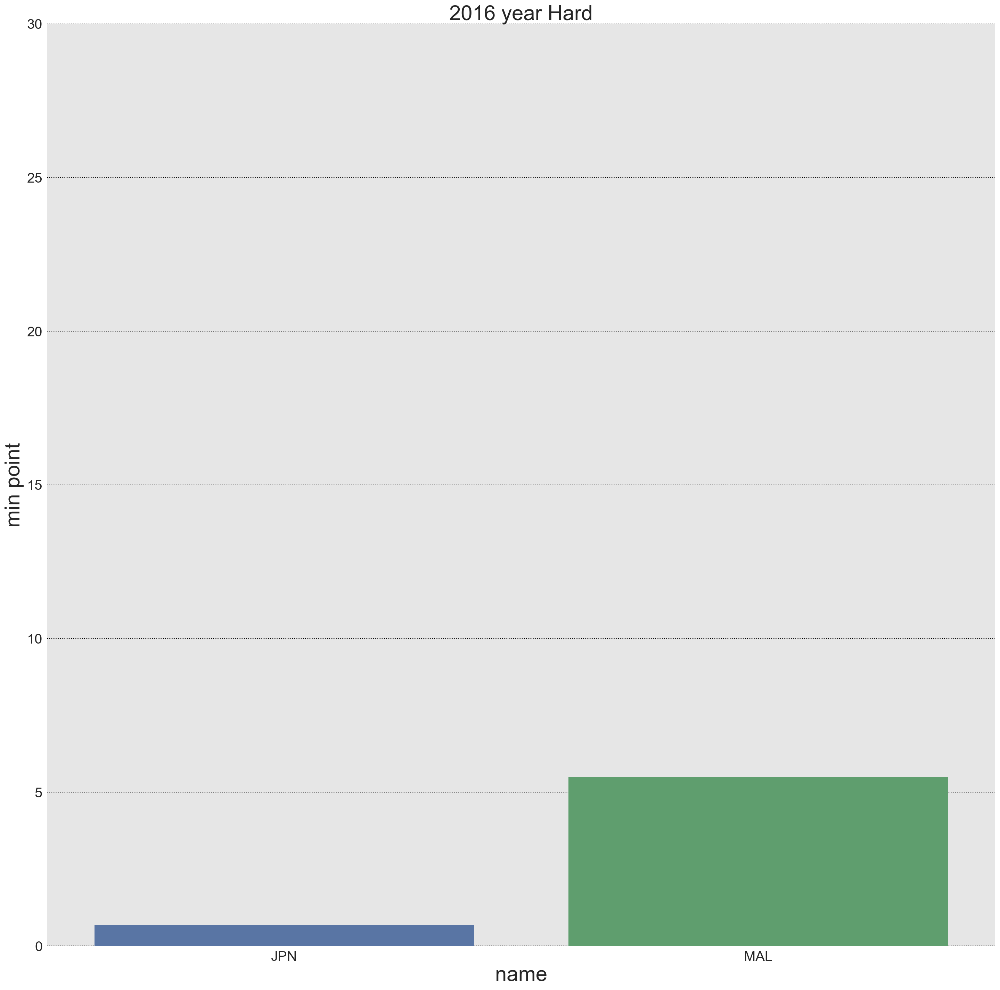

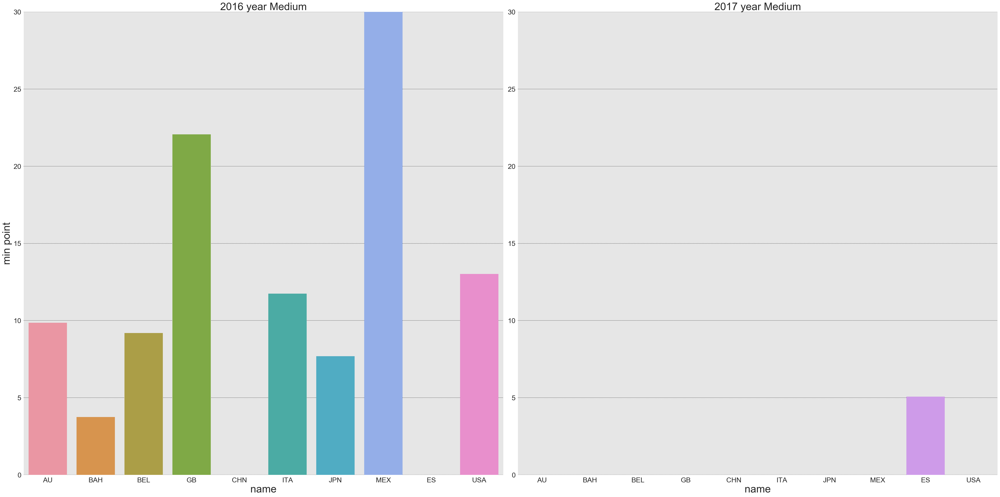

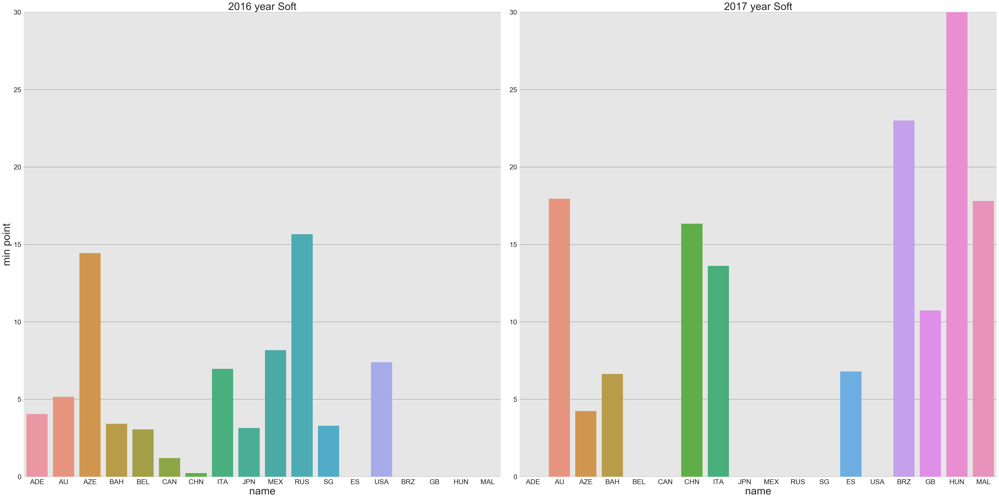

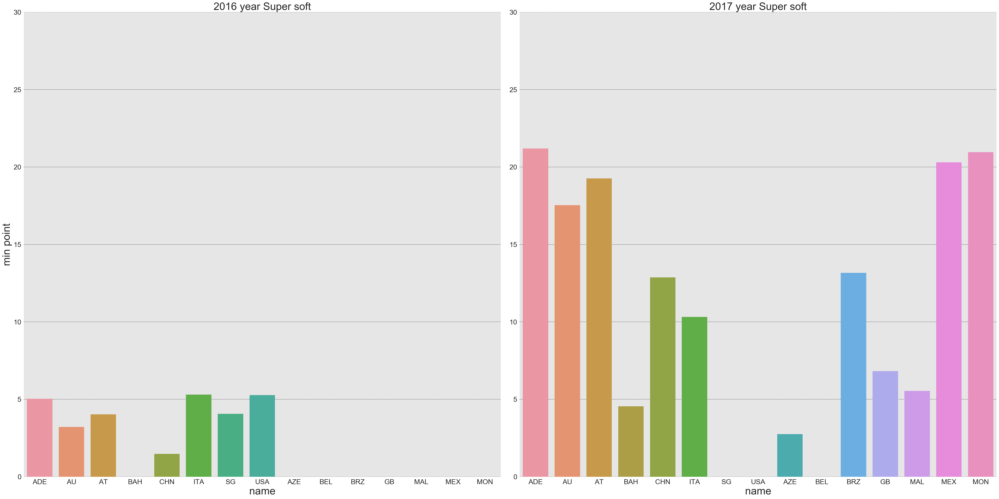

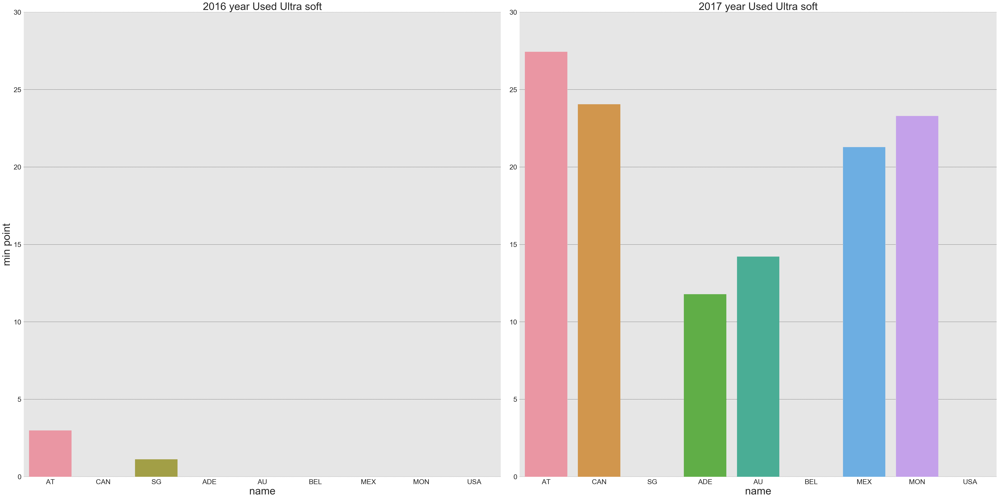

In [508]:
for i in TYRE_RACE_der.tyre.unique():
    ax = sns.factorplot(x='name', y="min point", col='year', kind="bar", size= 20, data=TYRE_RACE_der.groupby('tyre').get_group(i))
    ax.set_titles("{col_name} {col_var} " + str(i))
    ax.set(ylim=(0, 30))

#### 5d) Calculate degradation rating for each team

In [509]:
TYRE_TEAM_der = find_derivative_ALL(tyre_degrad_1617_TYRE_TEAM, "short", \
                                    ['tyre'], 'year', 'tyre', 'constructorRef', show_plot=False)

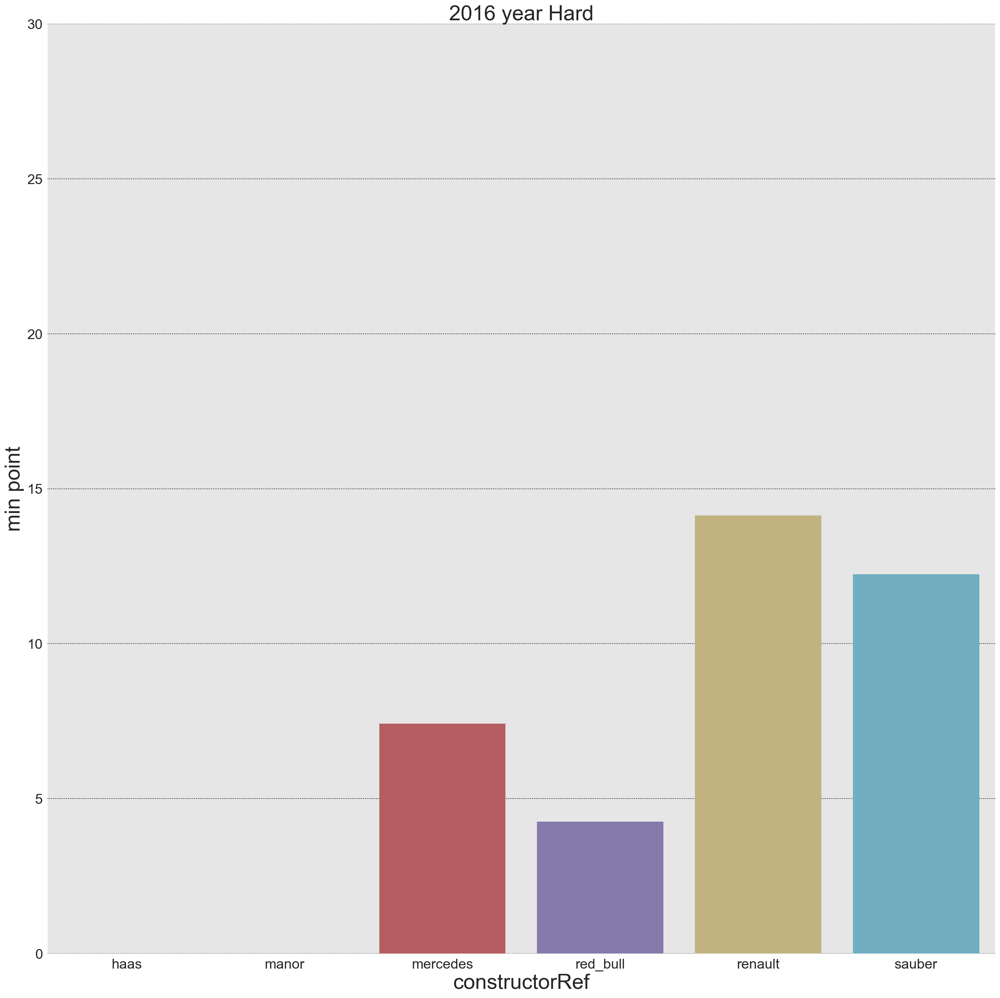

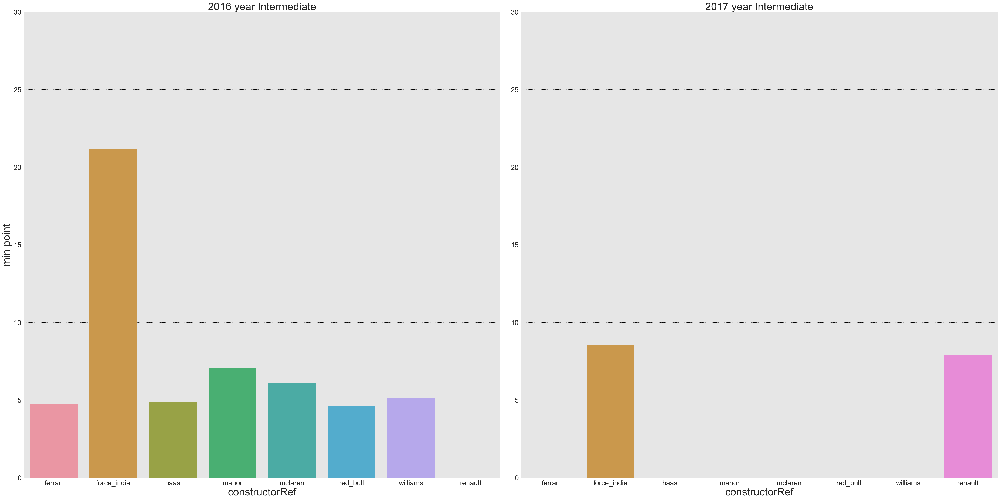

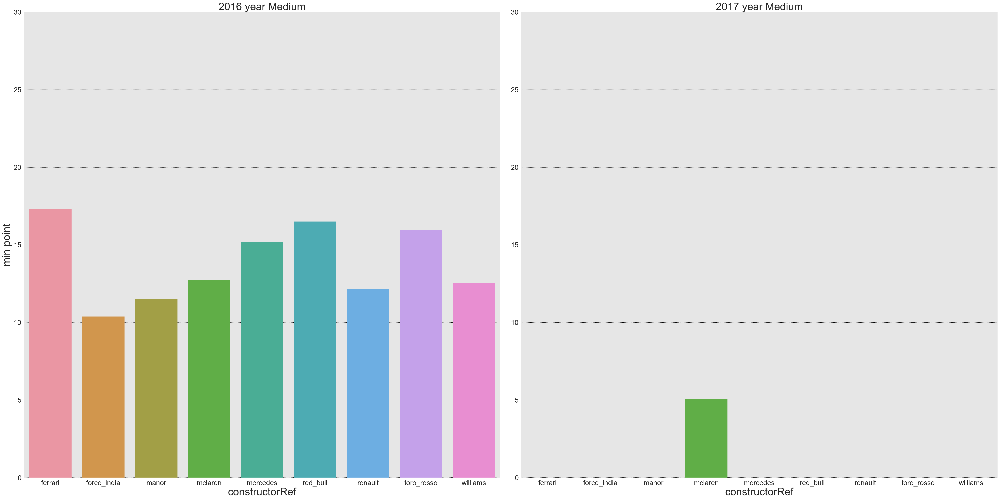

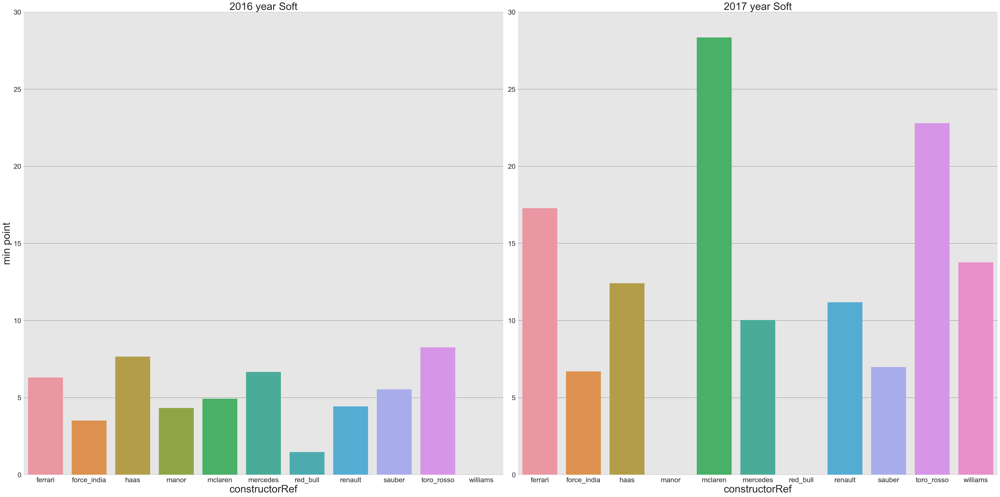

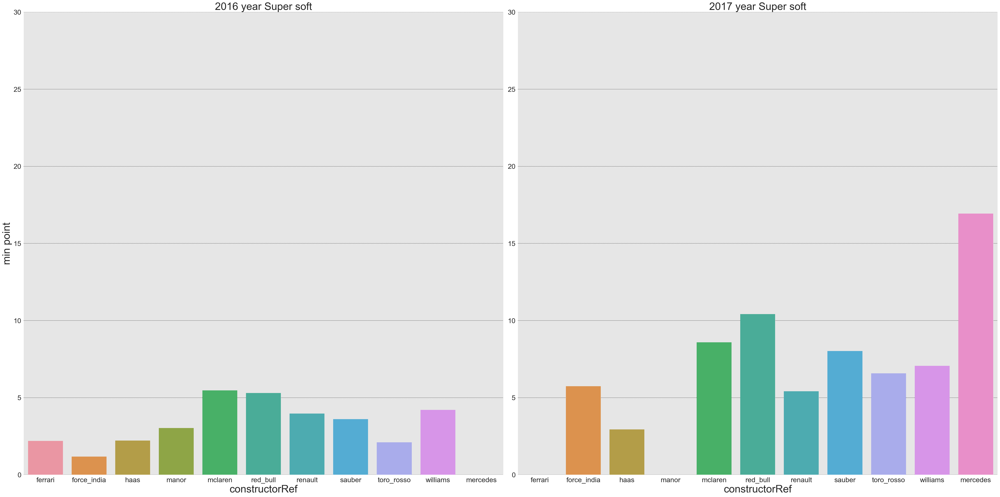

...

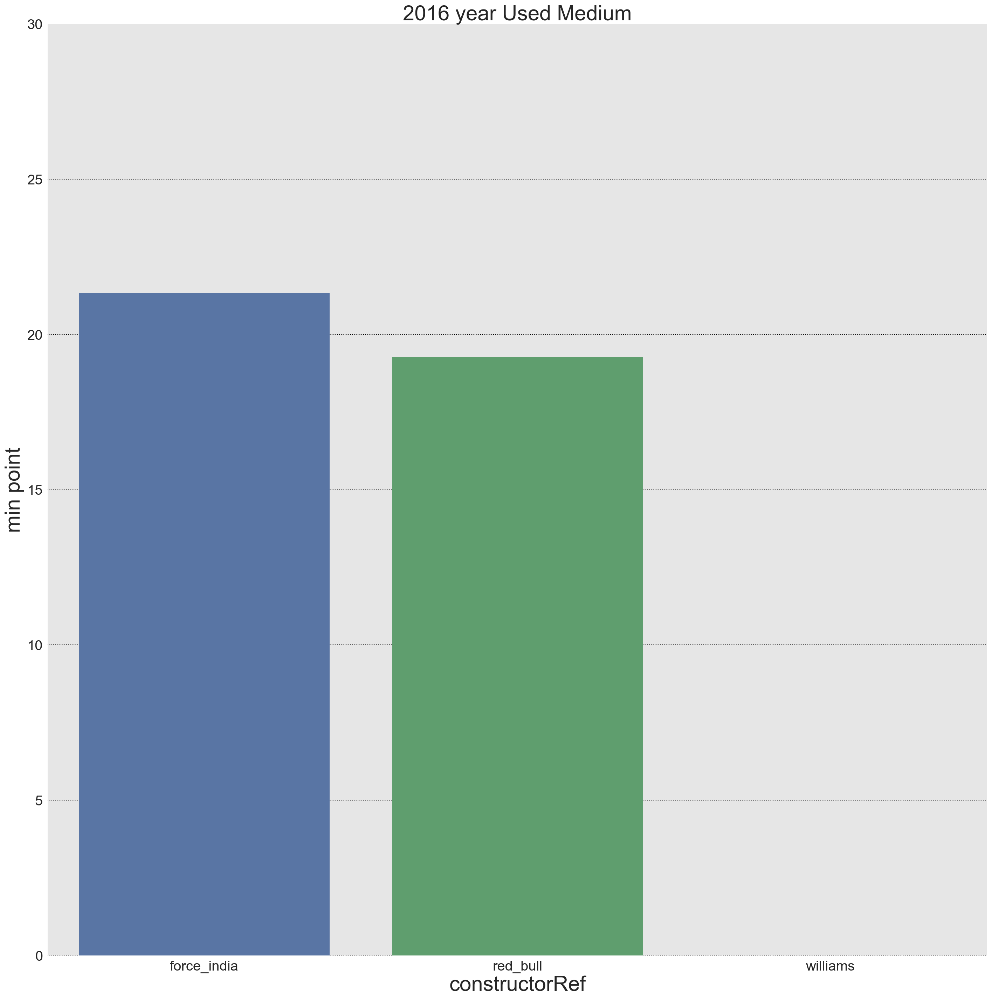

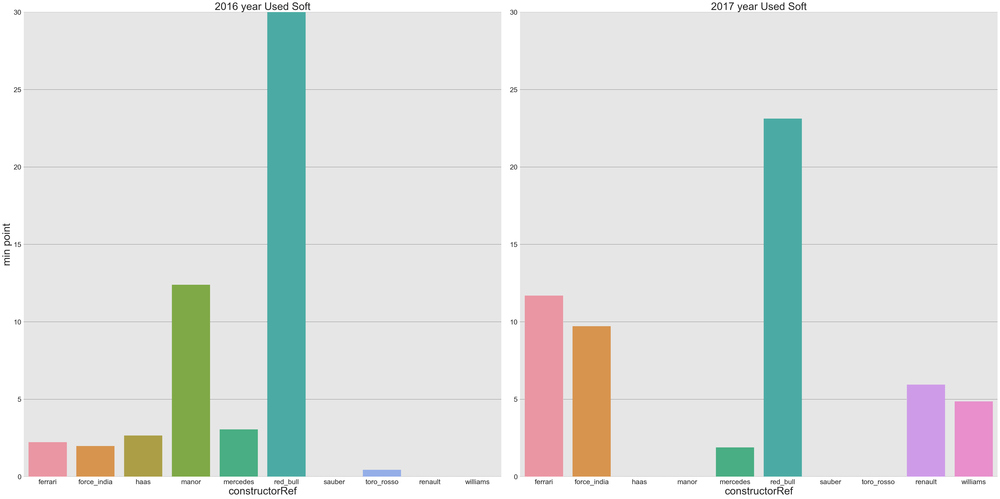

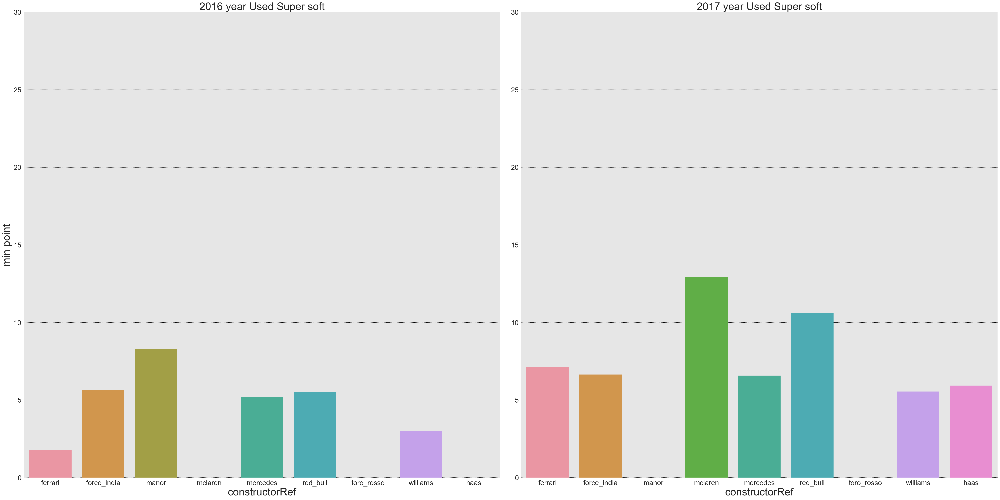

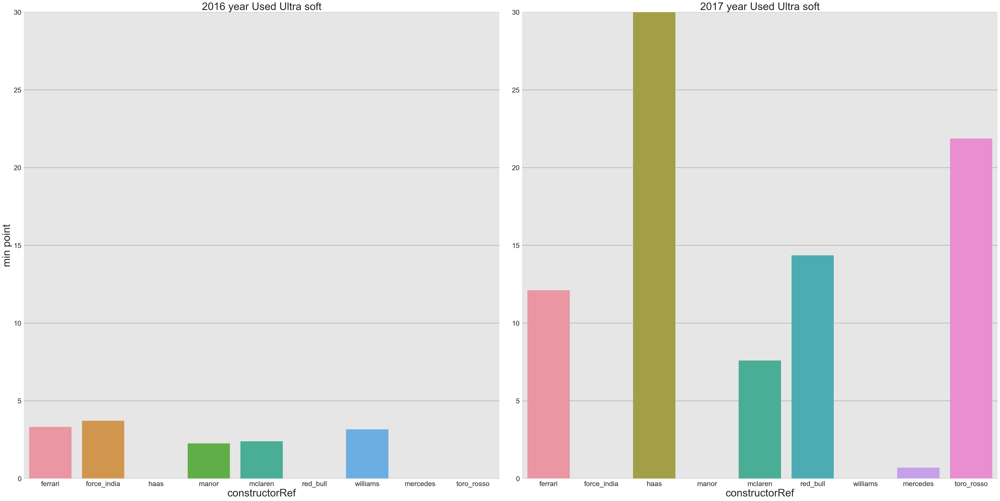

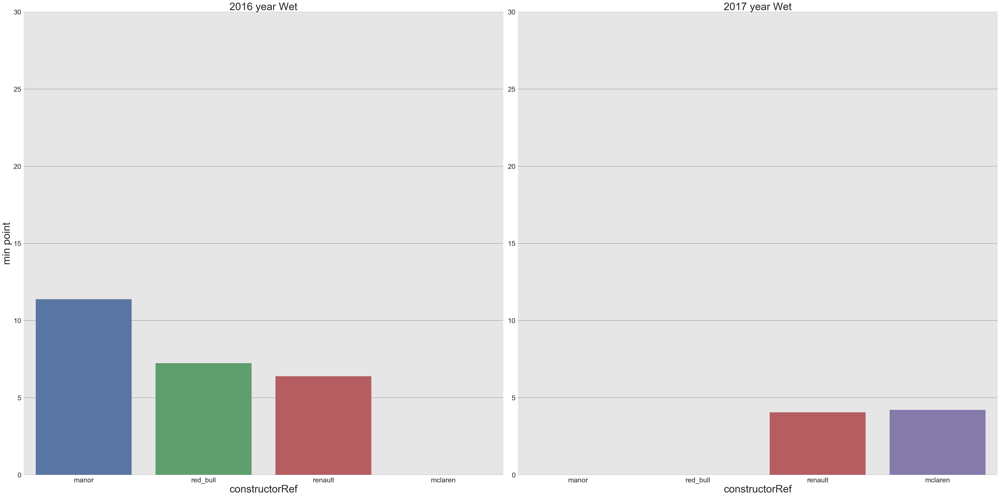

In [510]:
for i in TYRE_TEAM_der.tyre.unique():
    ax = sns.factorplot(x='constructorRef', y="min point", col='year', kind="bar", size= 20, data=TYRE_TEAM_der.groupby('tyre').get_group(i))
    ax.set_titles("{col_name} {col_var} " + str(i))
    ax.set(ylim=(0, 30))

### EVALUATION OF RESULTS

1. 